In [3]:
import random
import dill 
import datetime as dt
import glob 
from joblib import Parallel, delayed
import matplotlib.pyplot as plt
import pandas as pd
import scipy.spatial as spatial
import sys 
wd=".."
sys.path.append(wd+'//CPN//')
import numpy as np 
import statsmodels.api as sm
from tqdm import tqdm_notebook, tqdm
import brokenaxes
import math
import os
from analysis_misc_functions import *

In [6]:
group_heading_variation = [0, 10, 30, 50, "swarming", "milling"]
list_of_folder_ids_all_heading_vars= []
list_of_folder_ids_array_version_all_heading_vars= []
for heading_var in group_heading_variation:
    results_folder = wd+"/simulations/effect_of_heading_plus_radial/store_results copy/"+str(heading_var)+"/"
    list_of_folder_ids= glob.glob(results_folder+"*", recursive=True)
    list_of_folder_ids= np.sort(list_of_folder_ids)
    # # glob.glob(results_folder+"*")
    def clean_string_and_int_labels(input):
        try:
            output= float(input)
        except ValueError:
            output= input[1:-1]
        return output

    list_of_folder_ids= [str(i) for i in list_of_folder_ids]
    # list_of_folder_ids
    list_of_folder_ids_array_version= [i[len(results_folder):] for i in list_of_folder_ids]
    list_of_folder_ids_array_version= [i.split(",") for i in list_of_folder_ids_array_version]
    list_of_folder_ids_array_version= [(n[0][1:],n[1][:], n[2][1:-1]) for n in list_of_folder_ids_array_version]
    print(list_of_folder_ids_array_version)
    list_of_folder_ids_array_version= [(float(n[0]), float(n[1]), clean_string_and_int_labels(n[2])) for n in list_of_folder_ids_array_version]


    list_of_folder_ids_all_heading_vars.append(list_of_folder_ids)
    list_of_folder_ids_array_version_all_heading_vars.append(list_of_folder_ids_array_version)

[('0 ', '0', '0'), ('1', ' 1.5707963267948966', '0'), ('1', ' 4.71238898038469', '0'), ('2', ' 1.5707963267948966', '0'), ('2', ' 4.71238898038469', '0'), ('3', ' 1.5707963267948966', '0'), ('3', ' 4.71238898038469', '0'), ('4', ' 1.5707963267948966', '0'), ('4', ' 4.71238898038469', '0'), ('5', ' 1.5707963267948966', '0'), ('5', ' 4.71238898038469', '0'), ('6', ' 1.5707963267948966', '0'), ('6', ' 4.71238898038469', '0'), ('7', ' 1.5707963267948966', '0'), ('7', ' 4.71238898038469', '0')]
[('0', ' 0', '10'), ('1', ' 1.5707963267948966', '10'), ('1', ' 4.71238898038469', '10'), ('2', ' 1.5707963267948966', '10'), ('2', ' 4.71238898038469', '10'), ('3', ' 1.5707963267948966', '10'), ('3', ' 4.71238898038469', '10'), ('4', ' 1.5707963267948966', '10'), ('4', ' 4.71238898038469', '10'), ('5', ' 1.5707963267948966', '10'), ('5', ' 4.71238898038469', '10'), ('6', ' 1.5707963267948966', '10'), ('6', ' 4.71238898038469', '10'), ('7', ' 1.5707963267948966', '10'), ('7', ' 4.71238898038469', '1

In [8]:
list_of_folder_ids_array_version[0][1]

0.0

In [9]:
folder_id= list_of_folder_ids_all_heading_vars[2][0]
all_results = glob.glob(folder_id+'/*.simresults')
some_results = random.sample(all_results, int(len(all_results)*1.0))
all_results

['../simulations/effect_of_heading_plus_radial/store_results copy/30/(0, 0, 30)/heading_direction_87d6d9c8-50b9-4376-b74b-f72f858f5323_478371920_.simresults',
 '../simulations/effect_of_heading_plus_radial/store_results copy/30/(0, 0, 30)/heading_direction_0f3a76d2-2e73-4769-a396-ad5daca5112d_829878881_.simresults',
 '../simulations/effect_of_heading_plus_radial/store_results copy/30/(0, 0, 30)/heading_direction_24fc6e99-d116-4ff6-bd14-d31eb20ce3c1_878901700_.simresults',
 '../simulations/effect_of_heading_plus_radial/store_results copy/30/(0, 0, 30)/heading_direction_ec1787c2-f34c-4cf7-bdd6-f80dca094048_598389966_.simresults',
 '../simulations/effect_of_heading_plus_radial/store_results copy/30/(0, 0, 30)/heading_direction_2729c608-49c8-46c5-8334-78ded0eb0034_798474549_.simresults',
 '../simulations/effect_of_heading_plus_radial/store_results copy/30/(0, 0, 30)/heading_direction_23c5108f-66ae-4127-a661-1b9bda2b935c_96651178_.simresults',
 '../simulations/effect_of_heading_plus_radial/

In [10]:
extraction_fns = [get_num_echoes_heard, get_group_size, get_furthest_bat2bat_distance,
                 get_nearest_neighbour_distances, get_detection_distance, get_run_uuid,
                  get_run_random_seed,make_paramset_id, extract_parameter_values,
                 get_echo_levels, get_detection_azimuth]
keyword_arguments = {'nearest_nbrs':3}

In [11]:
keyword_arguments['variables_to_extract'] = ['heading_variation', 'echocall_duration','atmospheric_attenuation','min_spacing','source_level',
                        'interpulse_interval', 'implement_shadowing',
                                            ]

In [12]:
what_to_do = input('Do you want to "rerun" from scratch or 2, "reanalyse" from previous data')
task_type= input('What type of analysis is this?')

In [8]:
what_to_do

'rerun'

In [13]:
# if what_to_do == 'rerun':
store_info= {}
for heading_var in group_heading_variation:
    index= group_heading_variation.index(heading_var)
    list_of_folder_ids= list_of_folder_ids_all_heading_vars[index]; list_of_folder_ids_array_version= list_of_folder_ids_array_version_all_heading_vars[index]
    array_containing_all_simulation_datasets_raw = []
    iterant=0
    yyyymmdd = dt.datetime.now()
    timestamp = str([yyyymmdd.year,yyyymmdd.month,yyyymmdd.day,yyyymmdd.hour])
    make_dir(task_type+'_data'+timestamp+"/")
    for folder_id in list_of_folder_ids:
        all_results = glob.glob(folder_id+'/*.simresults')
        some_results =random.sample(all_results, int(len(all_results)*1.0))
        
        %time extracted_simdata = Parallel(n_jobs=4)(delayed(load_and_extract)(each, extraction_fns, **keyword_arguments) for each in tqdm(some_results))
        # print(extracted_simdata)
        echoes_heard = []
        group_size = []
        group_diameter = []
        nearest_3nbrs = []
        nbr_detection_range = []
        uuid = []
        seed = []
        param_ids = []
        parameter_values = []
        echo_levels = []
        detection_angle = []
        for each in extracted_simdata:
            for variable, list_to_append in zip(each, [echoes_heard, group_size, group_diameter,
                                                    nearest_3nbrs, nbr_detection_range,
                                                    uuid, seed, param_ids, parameter_values,
                                                    echo_levels, detection_angle]):
                list_to_append.append(variable)
        simulation_data = pd.DataFrame(data = {'nbrs_detected':echoes_heard,
                                        'group_size':group_size,
                                        'group_diameter':group_diameter,
                                        'nearest_neighbour_distance':nearest_3nbrs,
                                        'nbrs_detected_distance':nbr_detection_range,
                                        'uuid':uuid,
                                        'seed':seed,
                                        'paramset_id':param_ids,
                                        'parameters_joint':parameter_values,
                                        'echo_levels':echo_levels,
                                        'detection_azimuth':detection_angle})
        column_names = keyword_arguments['variables_to_extract']

        for each in column_names:
            simulation_data[each] = np.nan

        %time simulation_data = simulation_data.apply(split_parameters_joint_to_separate_columns, 1, col_names=column_names)    
        

        simulation_data["focal_bat"]= len(simulation_data)*[list_of_folder_ids_array_version[iterant]]

        ##### thanks to https://realpython.com/fast-flexible-pandas/#but-i-heard-that-pandas-is-slow
        # data_store = pd.HDFStore(task_type+'_data'+timestamp+'/'+folder_id+'.h5')
        # data_store['simulation_data'] = simulation_data
        # data_store.close()

        array_containing_all_simulation_datasets_raw.append(simulation_data)
        iterant+=1
    store_info[heading_var]= array_containing_all_simulation_datasets_raw
        
# if what_to_do == 'reanalyse':
#     # show all datasets in the folder
#     data_stores_in_folder = glob.glob(task_type+'_*]')

#     datastores_by_index = pd.DataFrame(data={'data_stores':data_stores_in_folder})
#     print(datastores_by_index)
#     # user-inputs dataset choice:
#     which_dataset = int(input('Give the index of the dataset you want to'))
#     print()
#     # load a pre-exisiting dataset
#     #load the saved data 
#     list_of_h5_files_in_folder= making_glob_work_properly(datastores_by_index["data_stores"][which_dataset])
#     # print(list_of_h5_files_in_folder); print("./"+datastores_by_index["data_stores"][which_dataset]+'/*')
#     array_containing_all_simulation_datasets_raw = []
#     list_of_folder_ids, list_of_folder_ids_array_version= run_while_reanalysis_to_change_folder_ids(list_of_h5_files_in_folder)
#     for h5_file in list_of_h5_files_in_folder:
#         data_load = pd.HDFStore("./"+datastores_by_index["data_stores"][which_dataset]+'/'+h5_file)
#         simulation_data = data_load['simulation_data']
#         array_containing_all_simulation_datasets_raw.append(simulation_data)
#         data_load.close()

# else:
#     raise IOError('Invalid input given!!')

100%|██████████| 300/300 [00:01<00:00, 285.20it/s]


CPU times: user 44.6 ms, sys: 10.8 ms, total: 55.4 ms
Wall time: 1.17 s
CPU times: user 15.8 ms, sys: 984 μs, total: 16.8 ms
Wall time: 16.8 ms


100%|██████████| 600/600 [00:00<00:00, 1312.77it/s]


CPU times: user 48.3 ms, sys: 6.52 ms, total: 54.8 ms
Wall time: 740 ms
CPU times: user 70 ms, sys: 19 μs, total: 70.1 ms
Wall time: 70.1 ms


100%|██████████| 600/600 [00:00<00:00, 1387.57it/s]


CPU times: user 45.9 ms, sys: 8.58 ms, total: 54.5 ms
Wall time: 691 ms
CPU times: user 33.1 ms, sys: 18 μs, total: 33.1 ms
Wall time: 33.1 ms


100%|██████████| 501/501 [00:00<00:00, 1737.00it/s]


CPU times: user 41.1 ms, sys: 6.09 ms, total: 47.2 ms
Wall time: 598 ms
CPU times: user 24 ms, sys: 1 ms, total: 25 ms
Wall time: 25 ms


100%|██████████| 502/502 [00:00<00:00, 1704.62it/s]


CPU times: user 42.2 ms, sys: 2.93 ms, total: 45.1 ms
Wall time: 610 ms
CPU times: user 26.9 ms, sys: 0 ns, total: 26.9 ms
Wall time: 26.9 ms


100%|██████████| 400/400 [00:00<00:00, 1363.86it/s]


CPU times: user 36.2 ms, sys: 4.17 ms, total: 40.3 ms
Wall time: 488 ms
CPU times: user 21.5 ms, sys: 958 μs, total: 22.4 ms
Wall time: 22.4 ms


100%|██████████| 400/400 [00:00<00:00, 1161.45it/s]


CPU times: user 29.8 ms, sys: 6.31 ms, total: 36.1 ms
Wall time: 530 ms
CPU times: user 21.9 ms, sys: 0 ns, total: 21.9 ms
Wall time: 21.9 ms


100%|██████████| 299/299 [00:00<00:00, 1283.34it/s]


CPU times: user 39.6 ms, sys: 4.8 ms, total: 44.4 ms
Wall time: 397 ms
CPU times: user 16.1 ms, sys: 9 μs, total: 16.1 ms
Wall time: 16.1 ms


100%|██████████| 300/300 [00:00<00:00, 1316.07it/s]


CPU times: user 41.4 ms, sys: 5.53 ms, total: 47 ms
Wall time: 407 ms
CPU times: user 16.5 ms, sys: 46 μs, total: 16.6 ms
Wall time: 16.5 ms


100%|██████████| 200/200 [00:00<00:00, 1294.71it/s]


CPU times: user 21.1 ms, sys: 1.91 ms, total: 23 ms
Wall time: 264 ms
CPU times: user 52 ms, sys: 69 μs, total: 52 ms
Wall time: 51.9 ms


100%|██████████| 200/200 [00:00<00:00, 1367.18it/s]


CPU times: user 20.8 ms, sys: 889 μs, total: 21.7 ms
Wall time: 254 ms
CPU times: user 9.51 ms, sys: 1.87 ms, total: 11.4 ms
Wall time: 11.4 ms


100%|██████████| 100/100 [00:00<00:00, 1340.41it/s]


CPU times: user 16.9 ms, sys: 78 μs, total: 17 ms
Wall time: 142 ms
CPU times: user 6.26 ms, sys: 17 μs, total: 6.27 ms
Wall time: 6.28 ms


100%|██████████| 100/100 [00:00<00:00, 1122.72it/s]


CPU times: user 21.5 ms, sys: 2.94 ms, total: 24.5 ms
Wall time: 184 ms
CPU times: user 7.6 ms, sys: 0 ns, total: 7.6 ms
Wall time: 7.6 ms


0it [00:00, ?it/s]


CPU times: user 1.22 ms, sys: 18 μs, total: 1.24 ms
Wall time: 1.11 ms
CPU times: user 513 μs, sys: 0 ns, total: 513 μs
Wall time: 502 μs


0it [00:00, ?it/s]


CPU times: user 1.57 ms, sys: 0 ns, total: 1.57 ms
Wall time: 1.38 ms
CPU times: user 262 μs, sys: 0 ns, total: 262 μs
Wall time: 252 μs


100%|██████████| 300/300 [00:00<00:00, 1258.84it/s]


CPU times: user 43.6 ms, sys: 6.63 ms, total: 50.2 ms
Wall time: 376 ms
CPU times: user 15.9 ms, sys: 0 ns, total: 15.9 ms
Wall time: 15.9 ms


100%|██████████| 600/600 [00:00<00:00, 1251.11it/s]


CPU times: user 45 ms, sys: 13.3 ms, total: 58.3 ms
Wall time: 750 ms
CPU times: user 32.7 ms, sys: 1.06 ms, total: 33.7 ms
Wall time: 33.7 ms


100%|██████████| 600/600 [00:00<00:00, 1417.71it/s]


CPU times: user 49.8 ms, sys: 3.6 ms, total: 53.4 ms
Wall time: 708 ms
CPU times: user 31.6 ms, sys: 45 μs, total: 31.6 ms
Wall time: 31.7 ms


100%|██████████| 500/500 [00:00<00:00, 1670.43it/s]


CPU times: user 47 ms, sys: 3.45 ms, total: 50.5 ms
Wall time: 621 ms
CPU times: user 27.1 ms, sys: 17 μs, total: 27.2 ms
Wall time: 27.2 ms


100%|██████████| 501/501 [00:00<00:00, 1732.71it/s]


CPU times: user 44.9 ms, sys: 8.98 ms, total: 53.9 ms
Wall time: 619 ms
CPU times: user 28.3 ms, sys: 31 μs, total: 28.3 ms
Wall time: 28.3 ms


100%|██████████| 400/400 [00:00<00:00, 1300.77it/s]


CPU times: user 36.8 ms, sys: 0 ns, total: 36.8 ms
Wall time: 506 ms
CPU times: user 22.3 ms, sys: 0 ns, total: 22.3 ms
Wall time: 22.3 ms


100%|██████████| 400/400 [00:00<00:00, 1209.65it/s]


CPU times: user 34 ms, sys: 4.73 ms, total: 38.7 ms
Wall time: 537 ms
CPU times: user 21.4 ms, sys: 0 ns, total: 21.4 ms
Wall time: 21.4 ms


100%|██████████| 299/299 [00:00<00:00, 1187.72it/s]


CPU times: user 111 ms, sys: 5 ms, total: 116 ms
Wall time: 421 ms
CPU times: user 16.1 ms, sys: 15 μs, total: 16.1 ms
Wall time: 16.2 ms


100%|██████████| 299/299 [00:00<00:00, 1195.92it/s]


CPU times: user 44.5 ms, sys: 2.3 ms, total: 46.8 ms
Wall time: 428 ms
CPU times: user 17 ms, sys: 0 ns, total: 17 ms
Wall time: 17 ms


100%|██████████| 200/200 [00:00<00:00, 1192.54it/s]


CPU times: user 22.4 ms, sys: 3.61 ms, total: 26 ms
Wall time: 286 ms
CPU times: user 11.1 ms, sys: 15 μs, total: 11.2 ms
Wall time: 11.1 ms


100%|██████████| 200/200 [00:00<00:00, 1259.61it/s]


CPU times: user 25.2 ms, sys: 683 μs, total: 25.9 ms
Wall time: 275 ms
CPU times: user 11.6 ms, sys: 35 μs, total: 11.7 ms
Wall time: 11.7 ms


100%|██████████| 100/100 [00:00<00:00, 1046.49it/s]

CPU times: user 16.1 ms, sys: 3.81 ms, total: 19.9 ms
Wall time: 184 ms


CPU times: user 6.14 ms, sys: 14 μs, total: 6.15 ms
Wall time: 6.09 ms


100%|██████████| 100/100 [00:00<00:00, 1209.05it/s]


CPU times: user 19 ms, sys: 982 μs, total: 20 ms
Wall time: 173 ms
CPU times: user 5.7 ms, sys: 45 μs, total: 5.75 ms
Wall time: 5.75 ms


0it [00:00, ?it/s]


CPU times: user 522 μs, sys: 916 μs, total: 1.44 ms
Wall time: 1.58 ms
CPU times: user 0 ns, sys: 231 μs, total: 231 μs
Wall time: 226 μs


0it [00:00, ?it/s]


CPU times: user 865 μs, sys: 359 μs, total: 1.22 ms
Wall time: 1.1 ms
CPU times: user 179 μs, sys: 8 μs, total: 187 μs
Wall time: 180 μs


100%|██████████| 300/300 [00:00<00:00, 1584.73it/s]


CPU times: user 38.7 ms, sys: 379 μs, total: 39.1 ms
Wall time: 325 ms
CPU times: user 16.7 ms, sys: 31 μs, total: 16.7 ms
Wall time: 16.7 ms


100%|██████████| 600/600 [00:00<00:00, 1323.69it/s]


CPU times: user 54.1 ms, sys: 5.04 ms, total: 59.2 ms
Wall time: 754 ms
CPU times: user 30.2 ms, sys: 0 ns, total: 30.2 ms
Wall time: 30.2 ms


100%|██████████| 600/600 [00:00<00:00, 1444.48it/s]


CPU times: user 49.5 ms, sys: 1.81 ms, total: 51.3 ms
Wall time: 682 ms
CPU times: user 32.2 ms, sys: 0 ns, total: 32.2 ms
Wall time: 32.2 ms


100%|██████████| 501/501 [00:00<00:00, 1701.64it/s]


CPU times: user 41.5 ms, sys: 6.75 ms, total: 48.3 ms
Wall time: 608 ms
CPU times: user 27.5 ms, sys: 0 ns, total: 27.5 ms
Wall time: 27.5 ms


100%|██████████| 500/500 [00:00<00:00, 1710.00it/s]


CPU times: user 52.2 ms, sys: 552 μs, total: 52.8 ms
Wall time: 618 ms
CPU times: user 26.8 ms, sys: 1.04 ms, total: 27.9 ms
Wall time: 28.2 ms


100%|██████████| 400/400 [00:00<00:00, 1444.04it/s]


CPU times: user 32.4 ms, sys: 5.33 ms, total: 37.7 ms
Wall time: 468 ms
CPU times: user 20.9 ms, sys: 992 μs, total: 21.9 ms
Wall time: 22 ms


100%|██████████| 400/400 [00:00<00:00, 1449.65it/s]


CPU times: user 88.1 ms, sys: 2.71 ms, total: 90.8 ms
Wall time: 487 ms
CPU times: user 20.9 ms, sys: 2 μs, total: 20.9 ms
Wall time: 21 ms


100%|██████████| 300/300 [00:00<00:00, 1341.50it/s]


CPU times: user 40.2 ms, sys: 328 μs, total: 40.5 ms
Wall time: 376 ms
CPU times: user 16.3 ms, sys: 25 μs, total: 16.3 ms
Wall time: 16.4 ms


100%|██████████| 300/300 [00:00<00:00, 1357.57it/s]


CPU times: user 32.4 ms, sys: 5.93 ms, total: 38.3 ms
Wall time: 367 ms
CPU times: user 16.2 ms, sys: 23 μs, total: 16.3 ms
Wall time: 16.3 ms


100%|██████████| 200/200 [00:00<00:00, 1303.31it/s]


CPU times: user 21.3 ms, sys: 2.56 ms, total: 23.9 ms
Wall time: 264 ms
CPU times: user 10.7 ms, sys: 0 ns, total: 10.7 ms
Wall time: 10.7 ms


100%|██████████| 200/200 [00:00<00:00, 1343.74it/s]


CPU times: user 22.7 ms, sys: 421 μs, total: 23.1 ms
Wall time: 254 ms
CPU times: user 11 ms, sys: 0 ns, total: 11 ms
Wall time: 11 ms


100%|██████████| 100/100 [00:00<00:00, 1276.25it/s]


CPU times: user 14 ms, sys: 897 μs, total: 14.9 ms
Wall time: 143 ms
CPU times: user 5.79 ms, sys: 0 ns, total: 5.79 ms
Wall time: 5.79 ms


100%|██████████| 100/100 [00:00<00:00, 1332.86it/s]


CPU times: user 14.8 ms, sys: 3.05 ms, total: 17.8 ms
Wall time: 143 ms
CPU times: user 8.93 ms, sys: 0 ns, total: 8.93 ms
Wall time: 8.95 ms


0it [00:00, ?it/s]


CPU times: user 1.79 ms, sys: 0 ns, total: 1.79 ms
Wall time: 1.59 ms
CPU times: user 217 μs, sys: 3 μs, total: 220 μs
Wall time: 213 μs


0it [00:00, ?it/s]


CPU times: user 1.35 ms, sys: 0 ns, total: 1.35 ms
Wall time: 1.17 ms
CPU times: user 195 μs, sys: 0 ns, total: 195 μs
Wall time: 188 μs


100%|██████████| 300/300 [00:00<00:00, 1608.58it/s]


CPU times: user 36.2 ms, sys: 3.84 ms, total: 40 ms
Wall time: 315 ms
CPU times: user 16.2 ms, sys: 0 ns, total: 16.2 ms
Wall time: 16.1 ms


100%|██████████| 600/600 [00:00<00:00, 1418.40it/s]


CPU times: user 52.4 ms, sys: 932 μs, total: 53.3 ms
Wall time: 690 ms
CPU times: user 39 ms, sys: 13 μs, total: 39 ms
Wall time: 39.1 ms


100%|██████████| 600/600 [00:00<00:00, 1432.00it/s]


CPU times: user 52.3 ms, sys: 3.18 ms, total: 55.5 ms
Wall time: 691 ms
CPU times: user 31.8 ms, sys: 0 ns, total: 31.8 ms
Wall time: 31.8 ms


100%|██████████| 500/500 [00:00<00:00, 1711.02it/s]


CPU times: user 40.6 ms, sys: 4.04 ms, total: 44.6 ms
Wall time: 599 ms
CPU times: user 26.3 ms, sys: 0 ns, total: 26.3 ms
Wall time: 26.3 ms


100%|██████████| 503/503 [00:00<00:00, 1860.62it/s]


CPU times: user 39.3 ms, sys: 2.54 ms, total: 41.8 ms
Wall time: 557 ms
CPU times: user 78.2 ms, sys: 43 μs, total: 78.3 ms
Wall time: 78.3 ms


100%|██████████| 400/400 [00:00<00:00, 1298.77it/s]


CPU times: user 39.1 ms, sys: 1.09 ms, total: 40.2 ms
Wall time: 507 ms
CPU times: user 20.8 ms, sys: 0 ns, total: 20.8 ms
Wall time: 20.8 ms


100%|██████████| 400/400 [00:00<00:00, 1416.75it/s]


CPU times: user 30.5 ms, sys: 3.74 ms, total: 34.3 ms
Wall time: 468 ms
CPU times: user 21.3 ms, sys: 0 ns, total: 21.3 ms
Wall time: 21.3 ms


100%|██████████| 300/300 [00:00<00:00, 1323.84it/s]


CPU times: user 35.8 ms, sys: 6.83 ms, total: 42.7 ms
Wall time: 376 ms
CPU times: user 20.1 ms, sys: 0 ns, total: 20.1 ms
Wall time: 20.1 ms


100%|██████████| 300/300 [00:00<00:00, 1351.56it/s]


CPU times: user 35 ms, sys: 5.03 ms, total: 40.1 ms
Wall time: 376 ms
CPU times: user 16.5 ms, sys: 0 ns, total: 16.5 ms
Wall time: 16.5 ms


100%|██████████| 200/200 [00:00<00:00, 1307.38it/s]


CPU times: user 19.6 ms, sys: 6.88 ms, total: 26.5 ms
Wall time: 275 ms
CPU times: user 10.8 ms, sys: 0 ns, total: 10.8 ms
Wall time: 10.8 ms


100%|██████████| 200/200 [00:00<00:00, 1249.65it/s]


CPU times: user 23.9 ms, sys: 3.06 ms, total: 27 ms
Wall time: 275 ms
CPU times: user 11.4 ms, sys: 0 ns, total: 11.4 ms
Wall time: 11.4 ms


100%|██████████| 100/100 [00:00<00:00, 1255.59it/s]


CPU times: user 15.6 ms, sys: 1.97 ms, total: 17.5 ms
Wall time: 143 ms
CPU times: user 5.76 ms, sys: 0 ns, total: 5.76 ms
Wall time: 5.77 ms


100%|██████████| 100/100 [00:00<00:00, 1273.93it/s]


CPU times: user 14.5 ms, sys: 2.99 ms, total: 17.5 ms
Wall time: 163 ms
CPU times: user 5.15 ms, sys: 933 μs, total: 6.08 ms
Wall time: 6.02 ms


0it [00:00, ?it/s]


CPU times: user 727 μs, sys: 936 μs, total: 1.66 ms
Wall time: 1.49 ms
CPU times: user 194 μs, sys: 9 μs, total: 203 μs
Wall time: 195 μs


0it [00:00, ?it/s]


CPU times: user 1.23 ms, sys: 0 ns, total: 1.23 ms
Wall time: 1.07 ms
CPU times: user 176 μs, sys: 0 ns, total: 176 μs
Wall time: 175 μs


100%|██████████| 300/300 [00:00<00:00, 1628.50it/s]


CPU times: user 31.3 ms, sys: 3.09 ms, total: 34.4 ms
Wall time: 304 ms
CPU times: user 15.5 ms, sys: 0 ns, total: 15.5 ms
Wall time: 15.5 ms


100%|██████████| 600/600 [00:00<00:00, 1442.98it/s]


CPU times: user 44.3 ms, sys: 9.21 ms, total: 53.5 ms
Wall time: 699 ms
CPU times: user 32.6 ms, sys: 0 ns, total: 32.6 ms
Wall time: 32.7 ms


100%|██████████| 600/600 [00:00<00:00, 1422.46it/s]


CPU times: user 48.3 ms, sys: 2.1 ms, total: 50.4 ms
Wall time: 670 ms
CPU times: user 30 ms, sys: 1 ms, total: 31 ms
Wall time: 31 ms


100%|██████████| 501/501 [00:00<00:00, 1801.29it/s]


CPU times: user 39.8 ms, sys: 1.36 ms, total: 41.1 ms
Wall time: 569 ms
CPU times: user 29.5 ms, sys: 44 μs, total: 29.6 ms
Wall time: 29.6 ms


100%|██████████| 501/501 [00:00<00:00, 1820.54it/s]


CPU times: user 39.1 ms, sys: 6.37 ms, total: 45.4 ms
Wall time: 567 ms
CPU times: user 26.1 ms, sys: 0 ns, total: 26.1 ms
Wall time: 26.1 ms


100%|██████████| 400/400 [00:00<00:00, 1385.36it/s]


CPU times: user 36 ms, sys: 1.84 ms, total: 37.9 ms
Wall time: 517 ms
CPU times: user 78.2 ms, sys: 0 ns, total: 78.2 ms
Wall time: 78.1 ms


100%|██████████| 400/400 [00:00<00:00, 1445.88it/s]


CPU times: user 31.1 ms, sys: 6 ms, total: 37.1 ms
Wall time: 467 ms
CPU times: user 21 ms, sys: 3 μs, total: 21 ms
Wall time: 21 ms


100%|██████████| 300/300 [00:00<00:00, 1562.82it/s]


CPU times: user 32.3 ms, sys: 5.93 ms, total: 38.2 ms
Wall time: 326 ms
CPU times: user 22.7 ms, sys: 35 μs, total: 22.7 ms
Wall time: 22.8 ms


100%|██████████| 299/299 [00:00<00:00, 1537.13it/s]


CPU times: user 30.4 ms, sys: 5.8 ms, total: 36.2 ms
Wall time: 324 ms
CPU times: user 15.3 ms, sys: 21 μs, total: 15.3 ms
Wall time: 15.3 ms


100%|██████████| 200/200 [00:00<00:00, 1508.99it/s]


CPU times: user 15 ms, sys: 6.35 ms, total: 21.4 ms
Wall time: 224 ms
CPU times: user 10.7 ms, sys: 0 ns, total: 10.7 ms
Wall time: 10.7 ms


100%|██████████| 200/200 [00:00<00:00, 1518.49it/s]


CPU times: user 12.7 ms, sys: 9.34 ms, total: 22 ms
Wall time: 224 ms
CPU times: user 10.5 ms, sys: 0 ns, total: 10.5 ms
Wall time: 10.5 ms


100%|██████████| 100/100 [00:00<00:00, 1482.27it/s]


CPU times: user 6.68 ms, sys: 8.72 ms, total: 15.4 ms
Wall time: 123 ms
CPU times: user 5.61 ms, sys: 0 ns, total: 5.61 ms
Wall time: 5.62 ms


100%|██████████| 100/100 [00:00<00:00, 1322.15it/s]


CPU times: user 14.7 ms, sys: 4.84 ms, total: 19.6 ms
Wall time: 135 ms
CPU times: user 9.45 ms, sys: 20 μs, total: 9.47 ms
Wall time: 9.42 ms


0it [00:00, ?it/s]


CPU times: user 1.59 ms, sys: 0 ns, total: 1.59 ms
Wall time: 1.61 ms
CPU times: user 184 μs, sys: 0 ns, total: 184 μs
Wall time: 177 μs


0it [00:00, ?it/s]


CPU times: user 0 ns, sys: 1.2 ms, total: 1.2 ms
Wall time: 1.02 ms
CPU times: user 176 μs, sys: 0 ns, total: 176 μs
Wall time: 169 μs


100%|██████████| 300/300 [00:00<00:00, 1474.55it/s]


CPU times: user 39.3 ms, sys: 2.71 ms, total: 42 ms
Wall time: 336 ms
CPU times: user 15.9 ms, sys: 0 ns, total: 15.9 ms
Wall time: 15.9 ms


100%|██████████| 600/600 [00:00<00:00, 1441.02it/s]


CPU times: user 46.9 ms, sys: 4.99 ms, total: 51.9 ms
Wall time: 698 ms
CPU times: user 30.4 ms, sys: 20 μs, total: 30.4 ms
Wall time: 30.4 ms


100%|██████████| 600/600 [00:00<00:00, 1476.70it/s]


CPU times: user 37.3 ms, sys: 9.7 ms, total: 47 ms
Wall time: 668 ms
CPU times: user 30.9 ms, sys: 0 ns, total: 30.9 ms
Wall time: 30.9 ms


100%|██████████| 501/501 [00:00<00:00, 1792.05it/s]


CPU times: user 38.4 ms, sys: 2.94 ms, total: 41.4 ms
Wall time: 577 ms
CPU times: user 26.2 ms, sys: 20 μs, total: 26.2 ms
Wall time: 26.2 ms


100%|██████████| 500/500 [00:00<00:00, 1797.47it/s]


CPU times: user 41.3 ms, sys: 2.64 ms, total: 43.9 ms
Wall time: 588 ms
CPU times: user 33.4 ms, sys: 44 μs, total: 33.5 ms
Wall time: 33.5 ms


100%|██████████| 400/400 [00:00<00:00, 1395.87it/s]


CPU times: user 35.1 ms, sys: 1.7 ms, total: 36.8 ms
Wall time: 477 ms
CPU times: user 22.7 ms, sys: 0 ns, total: 22.7 ms
Wall time: 22.7 ms


100%|██████████| 400/400 [00:00<00:00, 1419.61it/s]


CPU times: user 25.6 ms, sys: 4.09 ms, total: 29.7 ms
Wall time: 455 ms
CPU times: user 84.7 ms, sys: 0 ns, total: 84.7 ms
Wall time: 84.6 ms


100%|██████████| 300/300 [00:00<00:00, 1388.24it/s]


CPU times: user 27.9 ms, sys: 6.66 ms, total: 34.6 ms
Wall time: 365 ms
CPU times: user 16.1 ms, sys: 0 ns, total: 16.1 ms
Wall time: 16.1 ms


100%|██████████| 300/300 [00:00<00:00, 1395.45it/s]


CPU times: user 30.5 ms, sys: 4.8 ms, total: 35.3 ms
Wall time: 375 ms
CPU times: user 16.1 ms, sys: 15 μs, total: 16.2 ms
Wall time: 16.2 ms


100%|██████████| 200/200 [00:00<00:00, 1262.59it/s]


CPU times: user 24.3 ms, sys: 2.15 ms, total: 26.4 ms
Wall time: 284 ms
CPU times: user 12.2 ms, sys: 21 μs, total: 12.3 ms
Wall time: 12.3 ms


100%|██████████| 200/200 [00:00<00:00, 1298.83it/s]


CPU times: user 24.3 ms, sys: 308 μs, total: 24.6 ms
Wall time: 264 ms
CPU times: user 10.7 ms, sys: 0 ns, total: 10.7 ms
Wall time: 10.7 ms


100%|██████████| 100/100 [00:00<00:00, 1171.17it/s]


CPU times: user 15.4 ms, sys: 802 μs, total: 16.2 ms
Wall time: 154 ms
CPU times: user 7.46 ms, sys: 23 μs, total: 7.49 ms
Wall time: 7.54 ms


100%|██████████| 100/100 [00:00<00:00, 1311.22it/s]


CPU times: user 16.2 ms, sys: 2.06 ms, total: 18.3 ms
Wall time: 142 ms
CPU times: user 5.75 ms, sys: 0 ns, total: 5.75 ms
Wall time: 5.77 ms


0it [00:00, ?it/s]


CPU times: user 1.62 ms, sys: 0 ns, total: 1.62 ms
Wall time: 1.55 ms
CPU times: user 200 μs, sys: 0 ns, total: 200 μs
Wall time: 193 μs


0it [00:00, ?it/s]

CPU times: user 1.23 ms, sys: 0 ns, total: 1.23 ms
Wall time: 1.05 ms
CPU times: user 183 μs, sys: 0 ns, total: 183 μs
Wall time: 182 μs


In [14]:
array_containing_all_simulation_datasets_raw[-1]["focal_bat"]

Series([], Name: focal_bat, dtype: float64)

In [15]:
for i in range(len(array_containing_all_simulation_datasets_raw)):
    try:
        print(array_containing_all_simulation_datasets_raw[i]["focal_bat"][0])
    except KeyError:
        continue

(0.0, 0.0, 'milling')
(1.0, 1.5707963267948966, 'milling')
(1.0, 4.71238898038469, 'milling')
(2.0, 1.5707963267948966, 'milling')
(2.0, 4.71238898038469, 'milling')
(3.0, 1.5707963267948966, 'milling')
(3.0, 4.71238898038469, 'milling')
(4.0, 1.5707963267948966, 'milling')
(4.0, 4.71238898038469, 'milling')
(5.0, 1.5707963267948966, 'milling')
(5.0, 4.71238898038469, 'milling')
(6.0, 1.5707963267948966, 'milling')
(6.0, 4.71238898038469, 'milling')


In [16]:
array_containing_all_simulation_datasets=[]
array_containing_labels= []
for simulation_data in array_containing_all_simulation_datasets_raw:
    try:
        if simulation_data["focal_bat"][0][2]==0:
            array_containing_all_simulation_datasets.append(simulation_data)
            array_containing_labels.append(simulation_data["focal_bat"][0])
    except KeyError:
        continue
array_containing_all_simulation_datasets
array_containing_labels= np.array(array_containing_labels)

In [15]:
array_containing_labels

array([], dtype=float64)

In [17]:

unique_angles_in_dataset= np.unique(array_containing_labels[:,1])
list_containing_simulated_data_sorted_by_angles= {}
print(unique_angles_in_dataset)
for angle in unique_angles_in_dataset:
    list_containing_simulated_data_sorted_by_angles[angle]= []
    sublist_true_false_labels= array_containing_labels[:,1]==angle
    sublist_given_angle= passing_true_false_indices_through_lists(array_containing_all_simulation_datasets, sublist_true_false_labels)
    list_containing_simulated_data_sorted_by_angles[angle].append(sublist_given_angle)

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

In [ ]:
simulation_data["focal_bat"]

Series([], Name: focal_bat, dtype: float64)

In [ ]:
for simulation_data in array_containing_all_simulation_datasets:
    print(np.unique(simulation_data["group_size"]))

[10 30 50 75]
[30 50]
[5]
[20 50]
[30 50]
[75]
[75]
[75]


In [ ]:
array_containing_all_simulation_datasets[1]["focal_bat"]

0      [1.0, 4.71238898038469, 0.0]
1      [1.0, 4.71238898038469, 0.0]
2      [1.0, 4.71238898038469, 0.0]
3      [1.0, 4.71238898038469, 0.0]
4      [1.0, 4.71238898038469, 0.0]
                   ...             
160    [1.0, 4.71238898038469, 0.0]
161    [1.0, 4.71238898038469, 0.0]
162    [1.0, 4.71238898038469, 0.0]
163    [1.0, 4.71238898038469, 0.0]
164    [1.0, 4.71238898038469, 0.0]
Name: focal_bat, Length: 165, dtype: object

1.5707963267948966


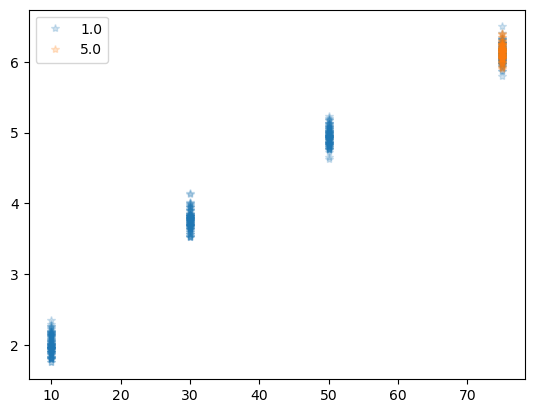

4.71238898038469


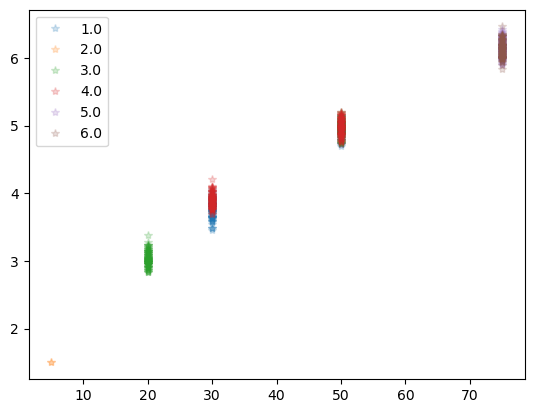

In [ ]:
%matplotlib inline
i=0
for angle in list_containing_simulated_data_sorted_by_angles.keys():
    subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]
    print(angle)
    for simulation_data in subset_given_angle:
        plt.plot(simulation_data['group_size'],
                    simulation_data['group_diameter'], 
                '*',label=simulation_data["focal_bat"][0][0],alpha=0.2)
        i+=1
    plt.legend()
    plt.show()

In [ ]:
simulation_data.keys()

Index(['nbrs_detected', 'group_size', 'group_diameter',
       'nearest_neighbour_distance', 'nbrs_detected_distance', 'uuid', 'seed',
       'paramset_id', 'parameters_joint', 'echo_levels', 'detection_azimuth',
       'heading_variation', 'echocall_duration', 'atmospheric_attenuation',
       'min_spacing', 'source_level', 'interpulse_interval',
       'implement_shadowing', 'focal_bat'],
      dtype='object')

In [ ]:
by_minspacing = simulation_data.groupby('min_spacing')
nearest_nbr_dist = {}
for spacing, df in by_minspacing:
    nearest_nbr_distances = df['nearest_neighbour_distance'].reset_index(drop=True)
    nearest_nbr_dist[spacing] = np.concatenate(nearest_nbr_distances)
nearest_nbr_dists_for_plot = [nearest_nbr_dist[0.5]]

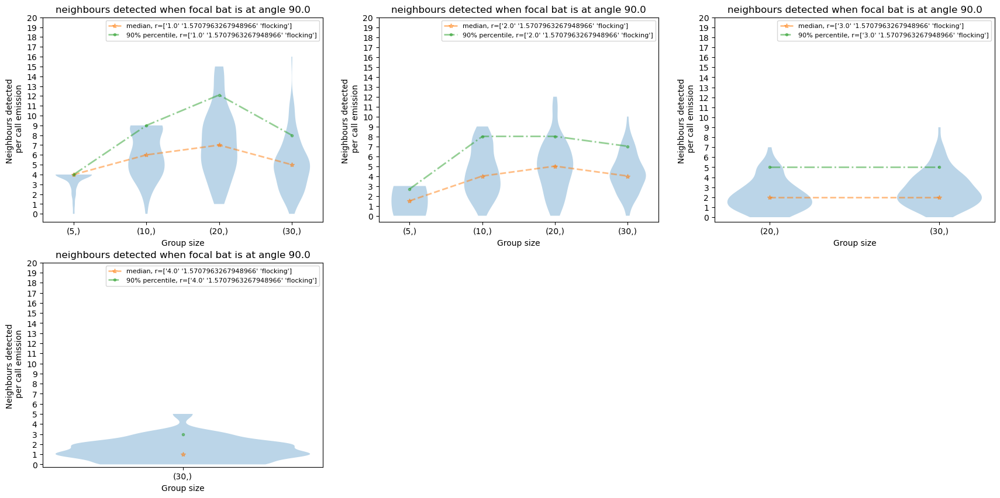

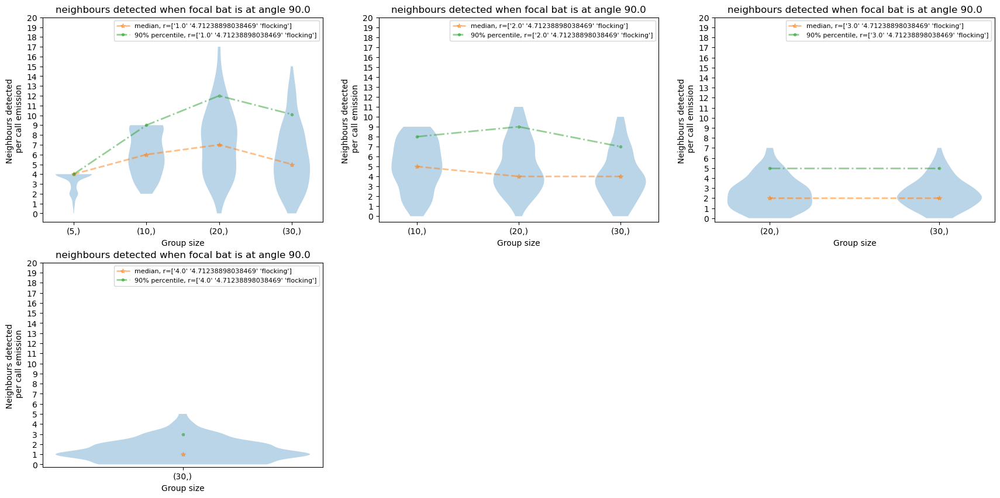

In [ ]:
iterant1_axis=0
# fig, axs = plt.subplots(1,3, figsize=(27,9))


for angle in list_containing_simulated_data_sorted_by_angles.keys():
        subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]; iterant2_color=0
        
        plt.figure(figsize=(21,10))
        i=1
        for simulation_data in subset_given_angle:
                data_by_groupsize = simulation_data.groupby(['group_size'])
                nbrs_detected_data = {}
                nbrs_detected_data['num_nbrs'] = []
                nbrs_detected_data['median_num_nbrs'] = []
                nbrs_detected_data['90%ile_num_nbrs'] = []
                groupsizes= []
                for groupsize, dataframe in data_by_groupsize:
                        groupsizes.append(groupsize)
                        nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                        nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                        nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

                breakup_x_axis  = np.arange(1,len(groupsizes)+1)+0.5
                nbrs_detected_data['median_num_nbrs']

                # plt.figure(figsize=(7,3.42))
                plt.subplot(2,3,i)
                plt.violinplot(nbrs_detected_data['num_nbrs'][:], showextrema=False)
                plt.plot(np.arange(1,len(groupsizes)+1),nbrs_detected_data['median_num_nbrs'][:],
                        '--*',linewidth=2, alpha=0.5,label="median, r="+str(simulation_data["focal_bat"][0]))#'median')
                # print(np.arange(1,len(groupsizes)))
                plt.plot(np.arange(1,len(groupsizes)+1), nbrs_detected_data['90%ile_num_nbrs'][:],
                        '-..',linewidth=2, alpha=0.5, label="90% percentile, r="+str(simulation_data["focal_bat"][0]))#label='90%ile')
                # plt.vlines(breakup_x_axis, -1,20, 'w',linewidth=30,alpha=1.0)
                plt.yticks(np.arange(0,21,1))
                plt.xticks(range(1,len(groupsizes)+1),groupsizes[:])
                plt.legend(fontsize=8)
                plt.ylabel('Neighbours detected \n per call emission', fontsize=10)
                plt.xlabel('Group size', fontsize=10)
                # # plt.ylim(0,20)

                # axs[i].tight_layout()
                plt.title("neighbours detected when focal bat is at angle "+str(np.degrees(np.pi/2)))
                iterant2_color+=1; i+=1
                
        iterant1_axis+=1
                # plt.savefig('Figure2_groupsize_1200dpi.pdf',
                #         bbox_inches='tight', pad_inches=0.05, format='pdf', dpi=1200)
        
        # print(groupsizes); print(nbrs_detected_data['median_num_nbrs'])

In [ ]:
store_info[10]

[     nbrs_detected  group_size  group_diameter  \
 0                1          50        4.981982   
 1                6          30        3.946143   
 2                3           5        1.036136   
 3                2          75        6.192973   
 4                8          10        2.002688   
 ..             ...         ...             ...   
 595              5          10        1.943582   
 596              2          50        4.839177   
 597              2           5        1.200109   
 598              1          20        2.878849   
 599              9          10        2.060233   
 
                             nearest_neighbour_distance  \
 0    [0.5076035912419788, 0.6218724544540727, 0.723...   
 1    [0.5107568558491086, 0.5196964536957928, 0.589...   
 2    [0.5469686704053571, 0.6959014348986038, 1.004...   
 3    [0.5267014784423539, 0.5412405256680821, 0.579...   
 4    [0.5055593736512486, 0.5069042955012203, 0.570...   
 ..                             

0
[[0.         0.         0.        ]
 [1.         1.57079633 0.        ]
 [1.         4.71238898 0.        ]
 [2.         1.57079633 0.        ]
 [2.         4.71238898 0.        ]
 [3.         1.57079633 0.        ]
 [3.         4.71238898 0.        ]
 [4.         1.57079633 0.        ]
 [4.         4.71238898 0.        ]
 [5.         1.57079633 0.        ]
 [5.         4.71238898 0.        ]
 [6.         1.57079633 0.        ]
 [6.         4.71238898 0.        ]]
[0.         1.57079633 4.71238898]
0
1
3
5
7
9
11
2
4
6
8
10
12
0.0


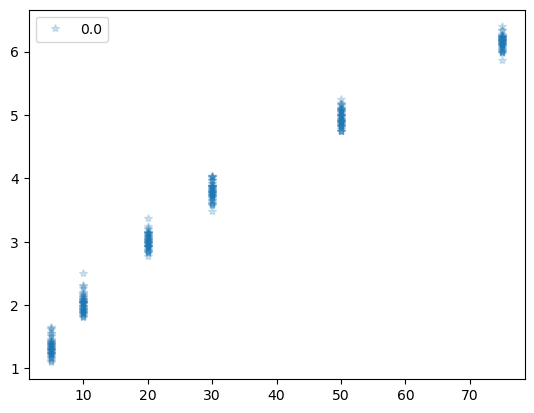

1.5707963267948966


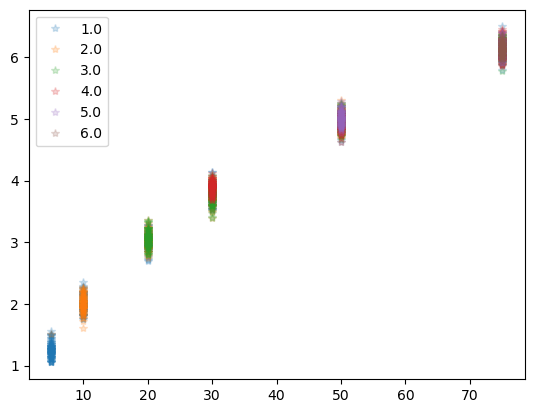

4.71238898038469


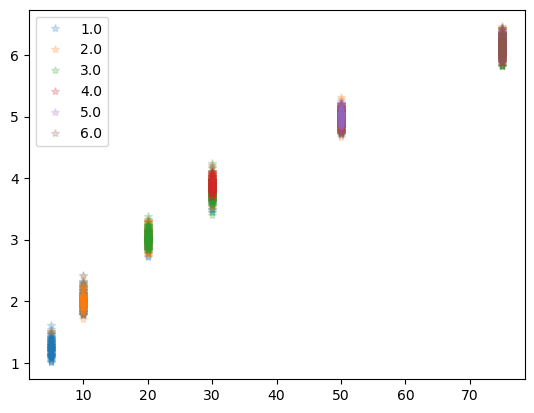

10
[[ 0.          0.         10.        ]
 [ 1.          1.57079633 10.        ]
 [ 1.          4.71238898 10.        ]
 [ 2.          1.57079633 10.        ]
 [ 2.          4.71238898 10.        ]
 [ 3.          1.57079633 10.        ]
 [ 3.          4.71238898 10.        ]
 [ 4.          1.57079633 10.        ]
 [ 4.          4.71238898 10.        ]
 [ 5.          1.57079633 10.        ]
 [ 5.          4.71238898 10.        ]
 [ 6.          1.57079633 10.        ]
 [ 6.          4.71238898 10.        ]]
[0.         1.57079633 4.71238898]
0
1
3
5
7
9
11
2
4
6
8
10
12
0.0


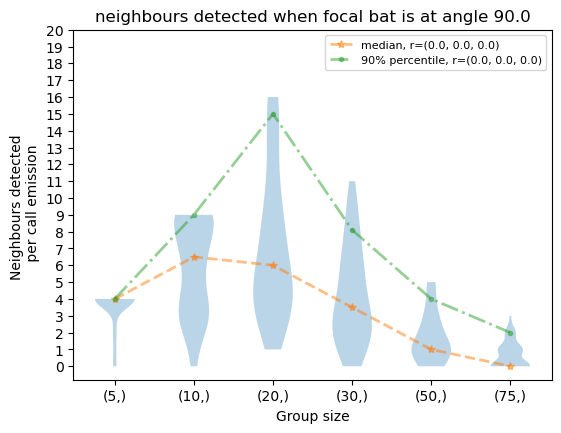

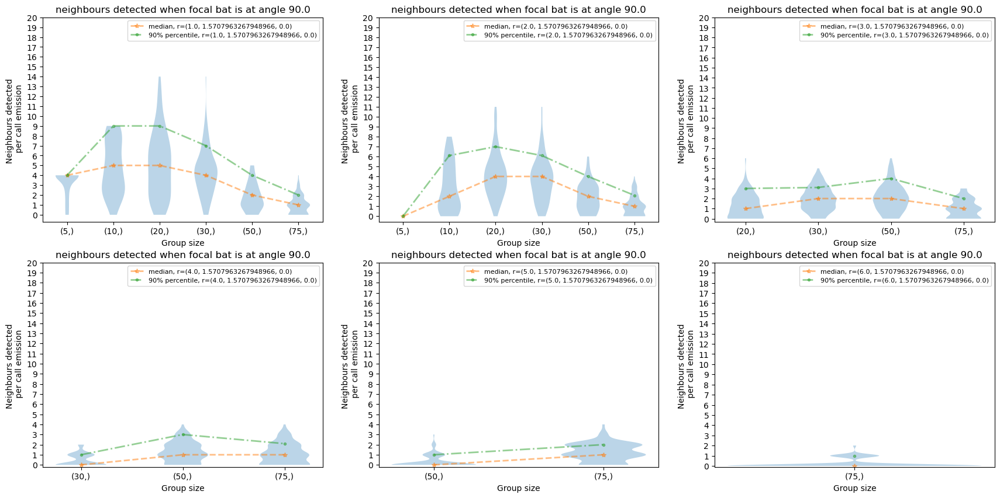

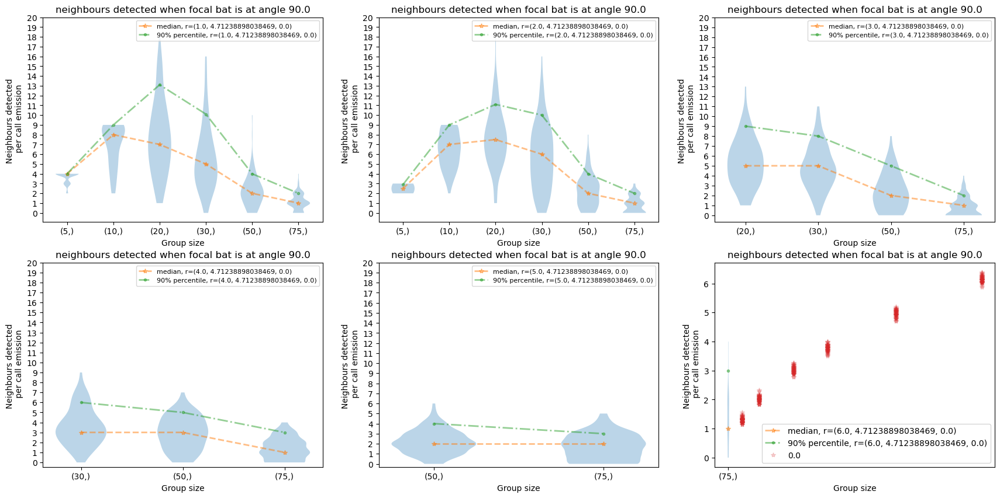

1.5707963267948966


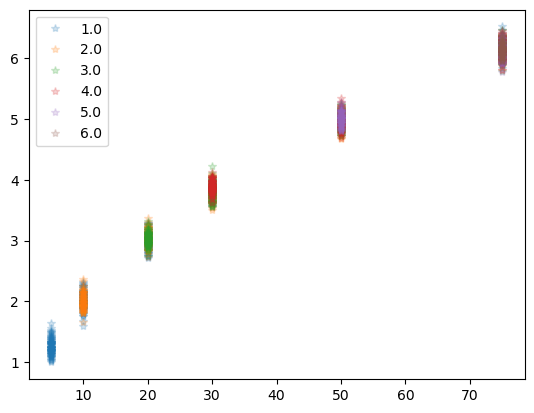

4.71238898038469


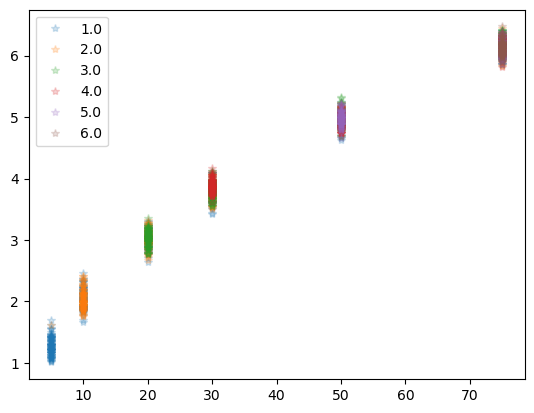

30
[[ 0.          0.         30.        ]
 [ 1.          1.57079633 30.        ]
 [ 1.          4.71238898 30.        ]
 [ 2.          1.57079633 30.        ]
 [ 2.          4.71238898 30.        ]
 [ 3.          1.57079633 30.        ]
 [ 3.          4.71238898 30.        ]
 [ 4.          1.57079633 30.        ]
 [ 4.          4.71238898 30.        ]
 [ 5.          1.57079633 30.        ]
 [ 5.          4.71238898 30.        ]
 [ 6.          1.57079633 30.        ]
 [ 6.          4.71238898 30.        ]]
[0.         1.57079633 4.71238898]
0
1
3
5
7
9
11
2
4
6
8
10
12
0.0


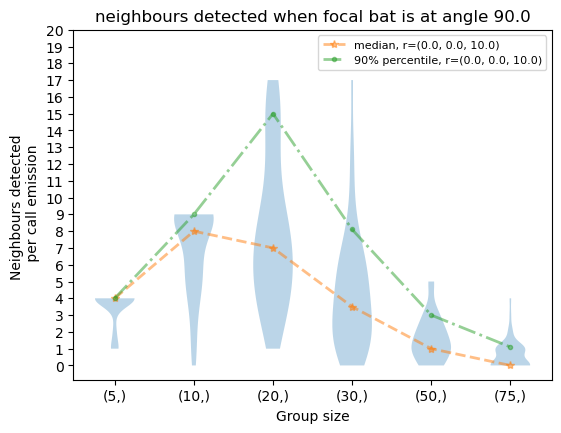

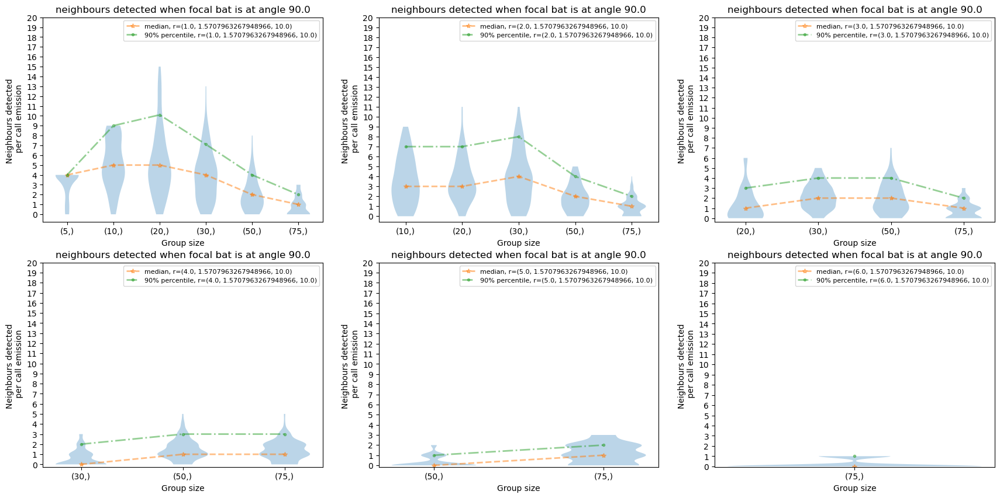

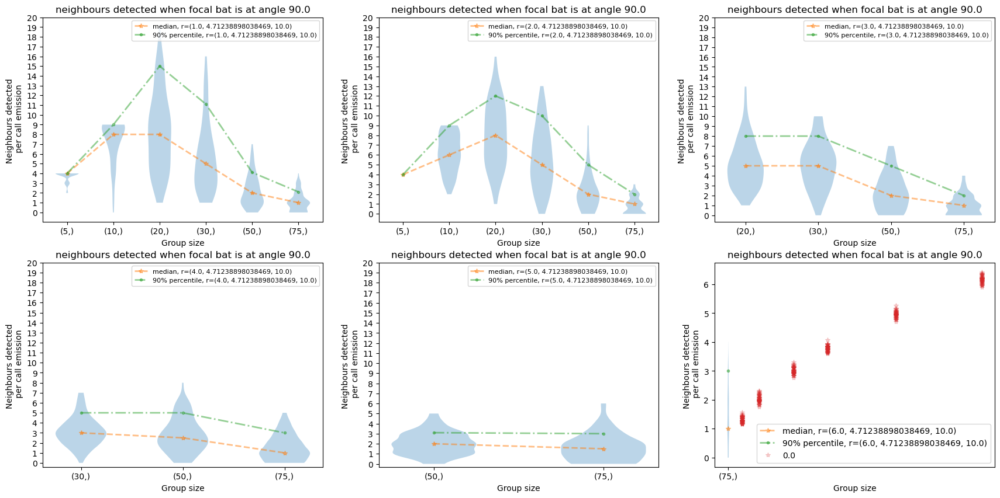

1.5707963267948966


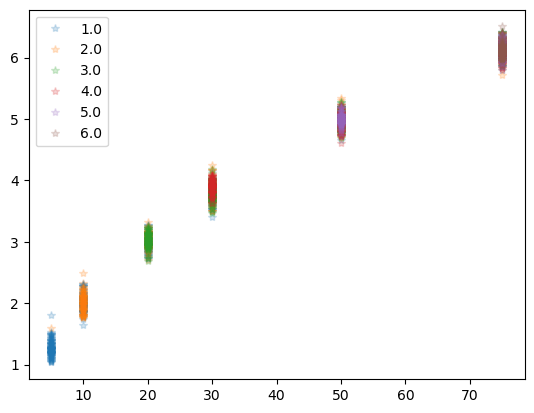

4.71238898038469


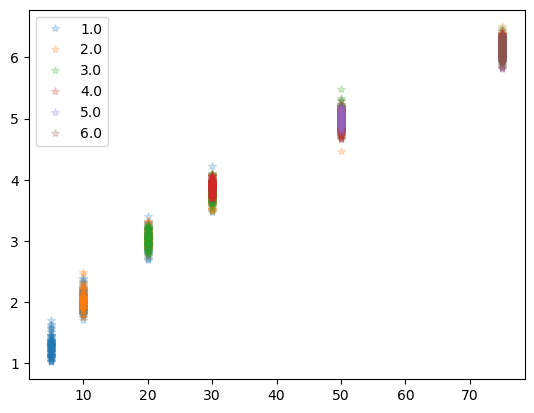

50
[[ 0.          0.         50.        ]
 [ 1.          1.57079633 50.        ]
 [ 1.          4.71238898 50.        ]
 [ 2.          1.57079633 50.        ]
 [ 2.          4.71238898 50.        ]
 [ 3.          1.57079633 50.        ]
 [ 3.          4.71238898 50.        ]
 [ 4.          1.57079633 50.        ]
 [ 4.          4.71238898 50.        ]
 [ 5.          1.57079633 50.        ]
 [ 5.          4.71238898 50.        ]
 [ 6.          1.57079633 50.        ]
 [ 6.          4.71238898 50.        ]]
[0.         1.57079633 4.71238898]
0
1
3
5
7
9
11
2
4
6
8
10
12
0.0


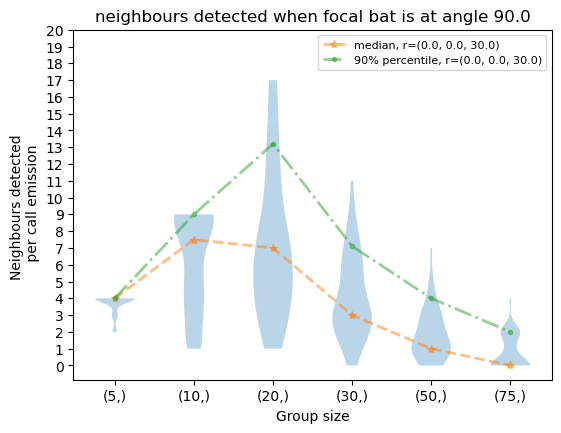

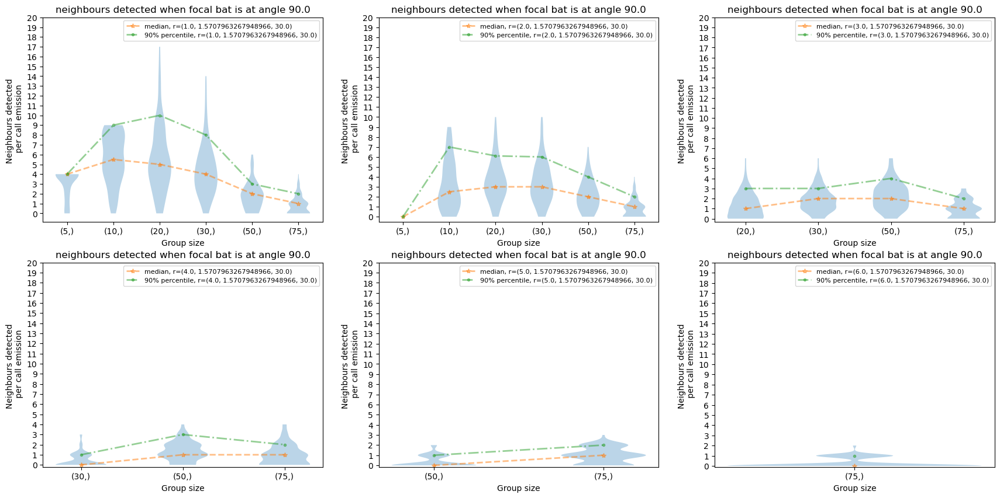

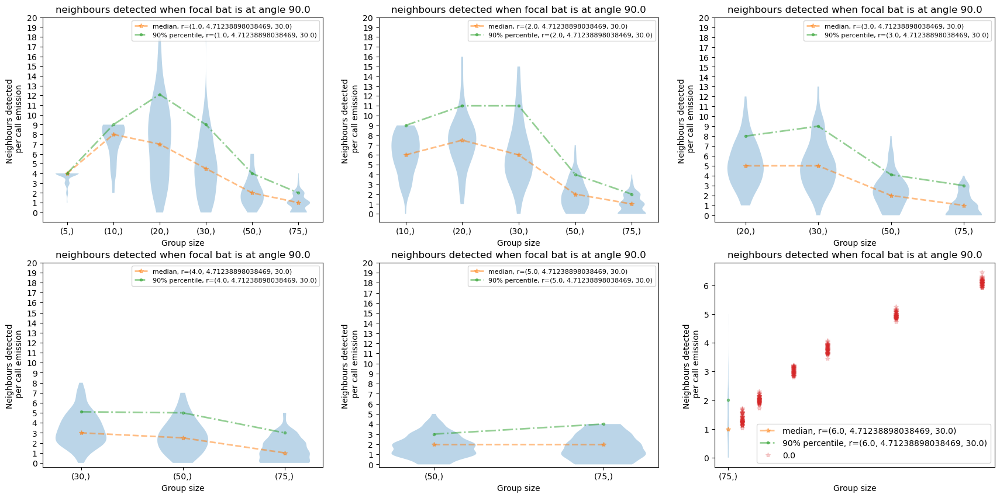

1.5707963267948966


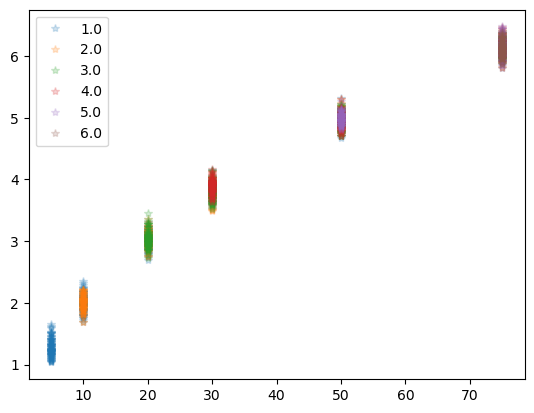

4.71238898038469


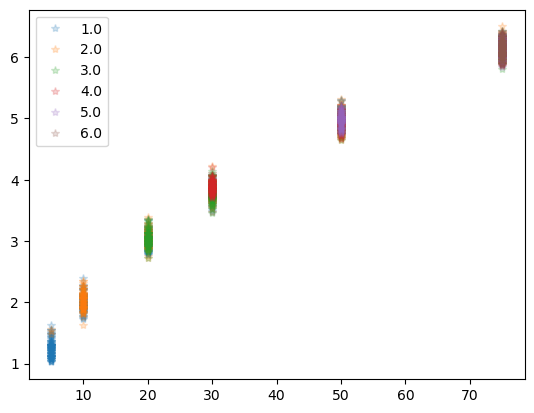

milling
[['0.0' '0.0' 'milling']
 ['1.0' '1.5707963267948966' 'milling']
 ['1.0' '4.71238898038469' 'milling']
 ['2.0' '1.5707963267948966' 'milling']
 ['2.0' '4.71238898038469' 'milling']
 ['3.0' '1.5707963267948966' 'milling']
 ['3.0' '4.71238898038469' 'milling']
 ['4.0' '1.5707963267948966' 'milling']
 ['4.0' '4.71238898038469' 'milling']
 ['5.0' '1.5707963267948966' 'milling']
 ['5.0' '4.71238898038469' 'milling']
 ['6.0' '1.5707963267948966' 'milling']
 ['6.0' '4.71238898038469' 'milling']]
['0.0' '1.5707963267948966' '4.71238898038469']
0
1
3
5
7
9
11
2
4
6
8
10
12
0.0


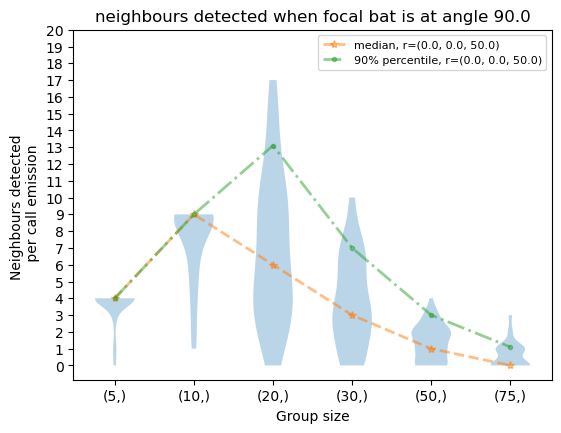

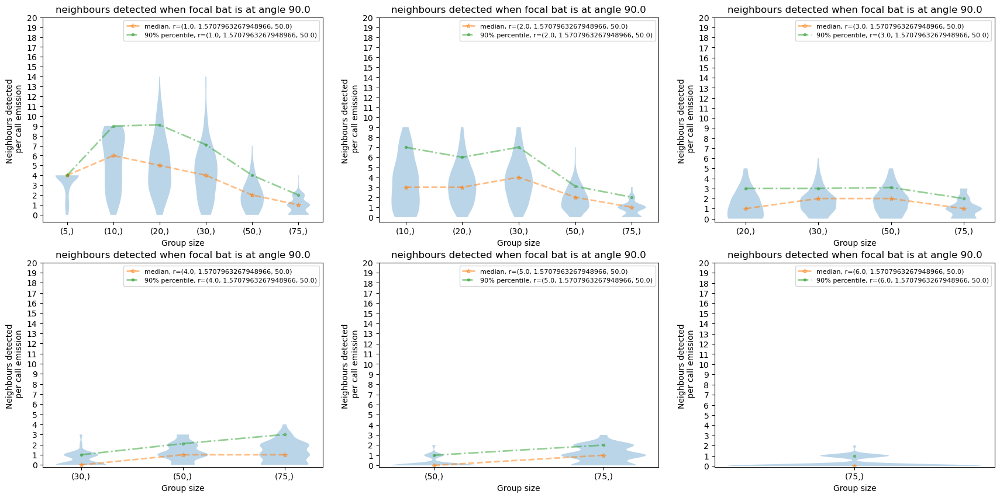

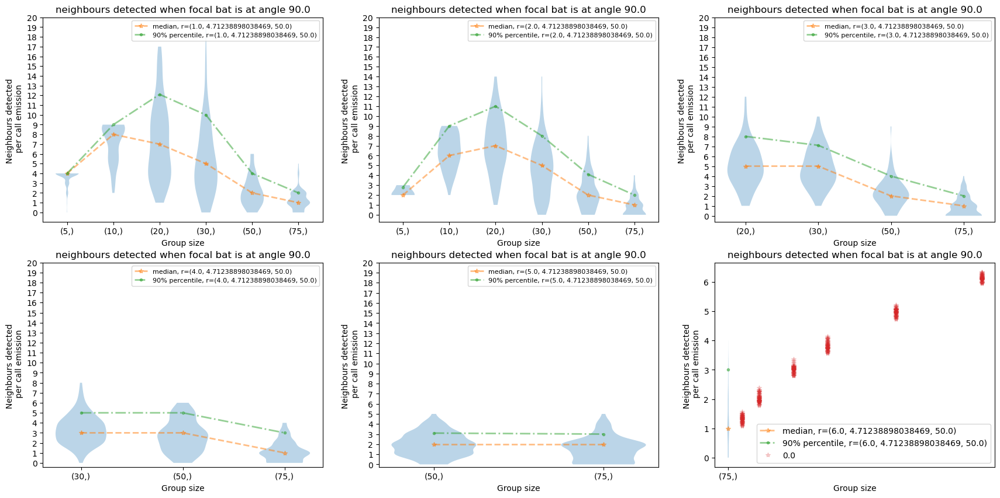

1.5707963267948966


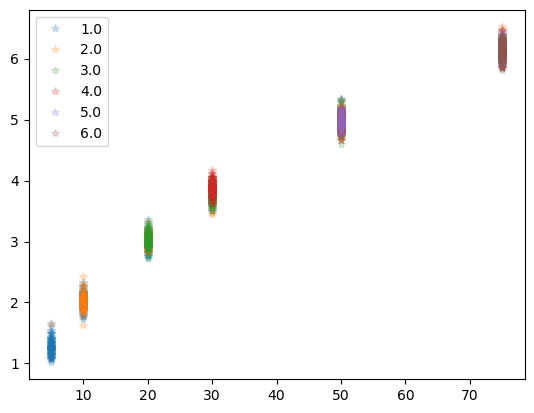

4.71238898038469


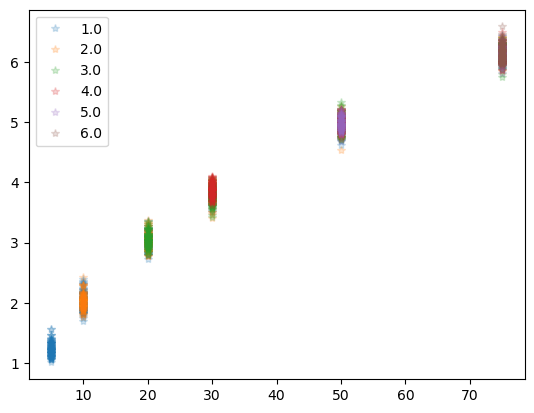

swarming
[['0.0' '0.0' 'swarming']
 ['1.0' '1.5707963267948966' 'swarming']
 ['1.0' '4.71238898038469' 'swarming']
 ['2.0' '1.5707963267948966' 'swarming']
 ['2.0' '4.71238898038469' 'swarming']
 ['3.0' '1.5707963267948966' 'swarming']
 ['3.0' '4.71238898038469' 'swarming']
 ['4.0' '1.5707963267948966' 'swarming']
 ['4.0' '4.71238898038469' 'swarming']
 ['5.0' '1.5707963267948966' 'swarming']
 ['5.0' '4.71238898038469' 'swarming']
 ['6.0' '1.5707963267948966' 'swarming']
 ['6.0' '4.71238898038469' 'swarming']]
['0.0' '1.5707963267948966' '4.71238898038469']
0
1
3
5
7
9
11
2
4
6
8
10
12
0.0


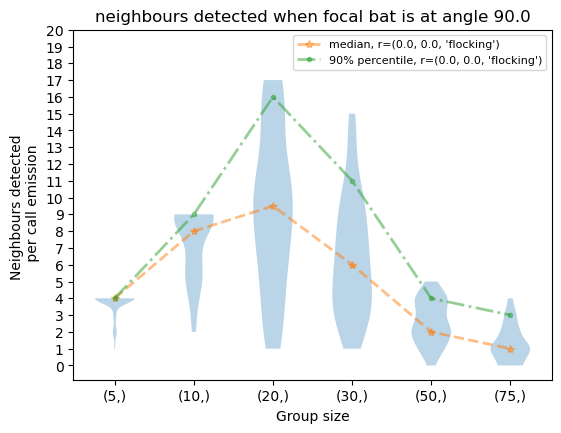

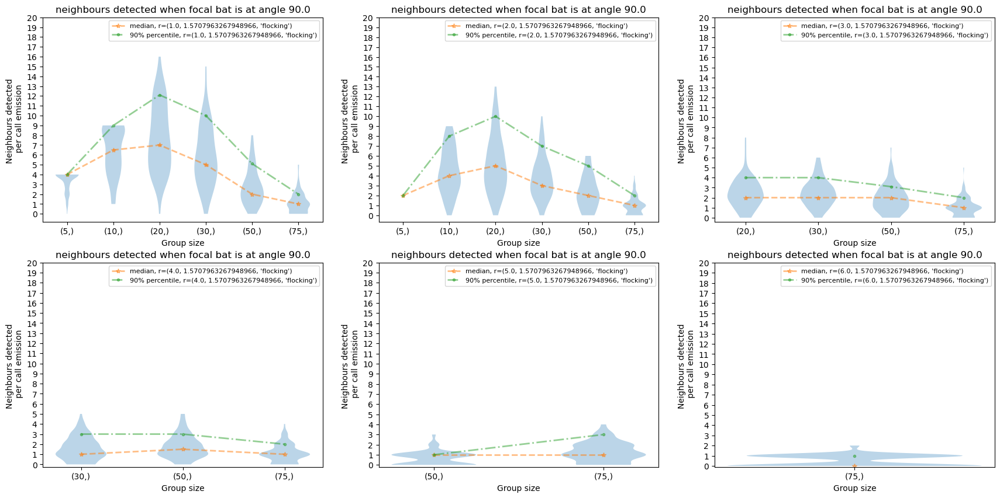

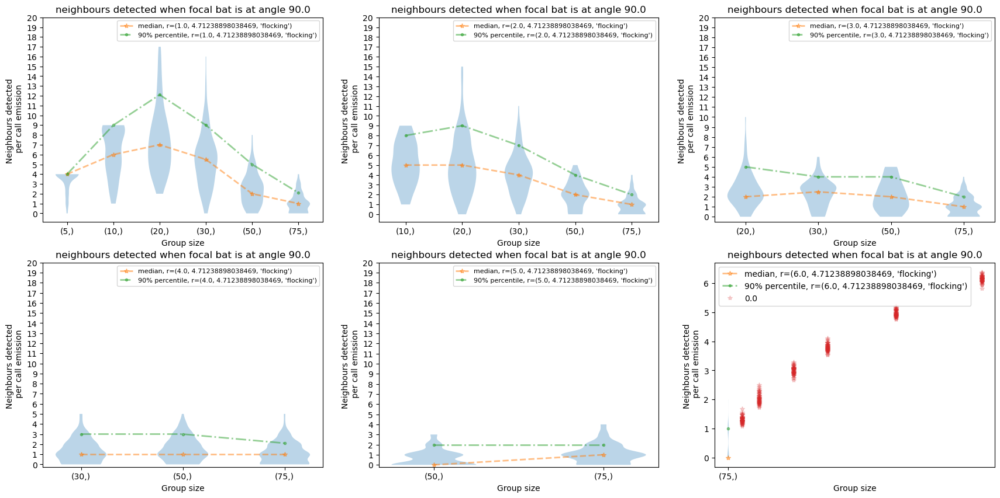

1.5707963267948966


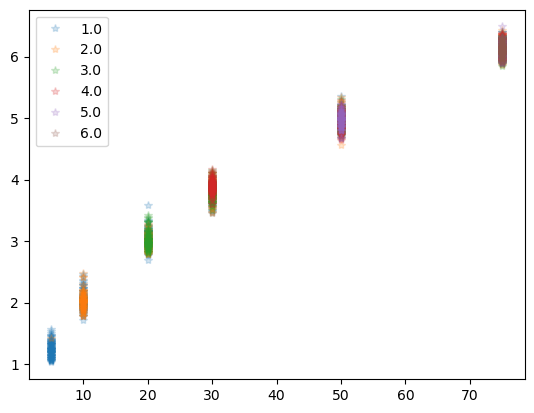

4.71238898038469


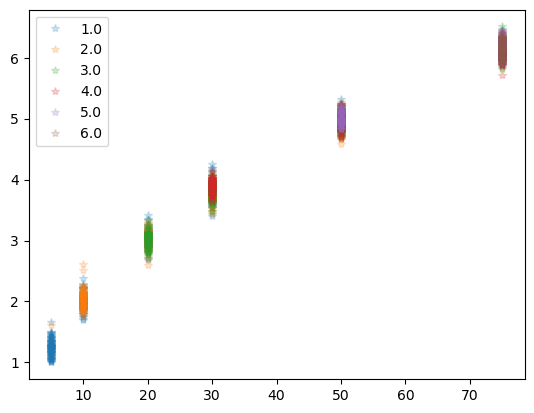

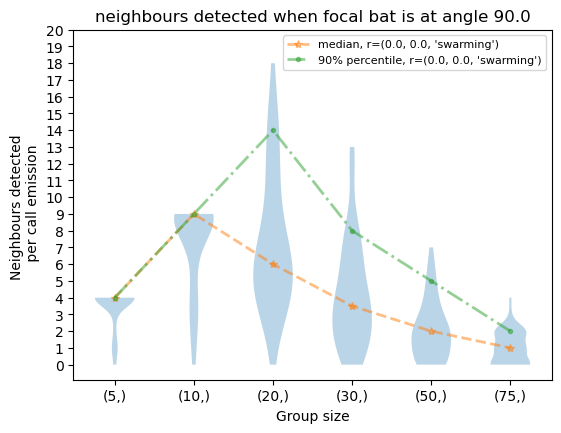

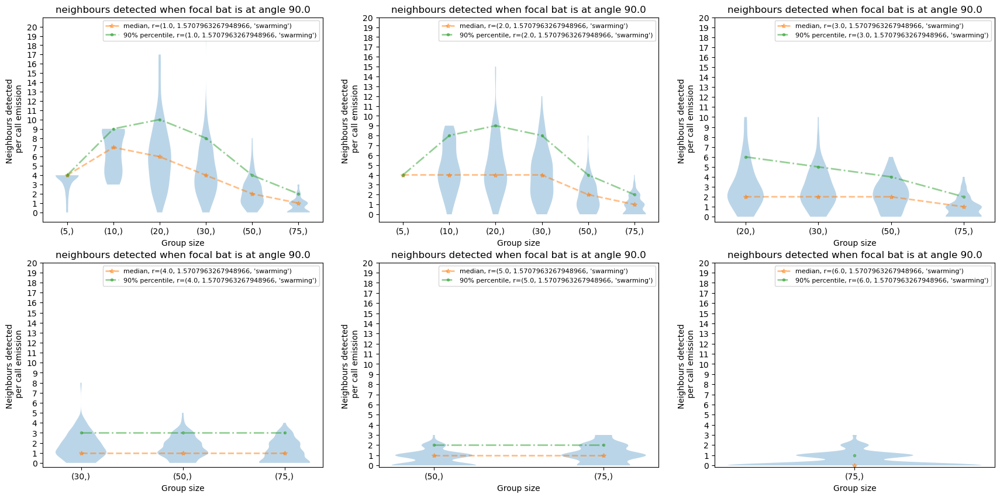

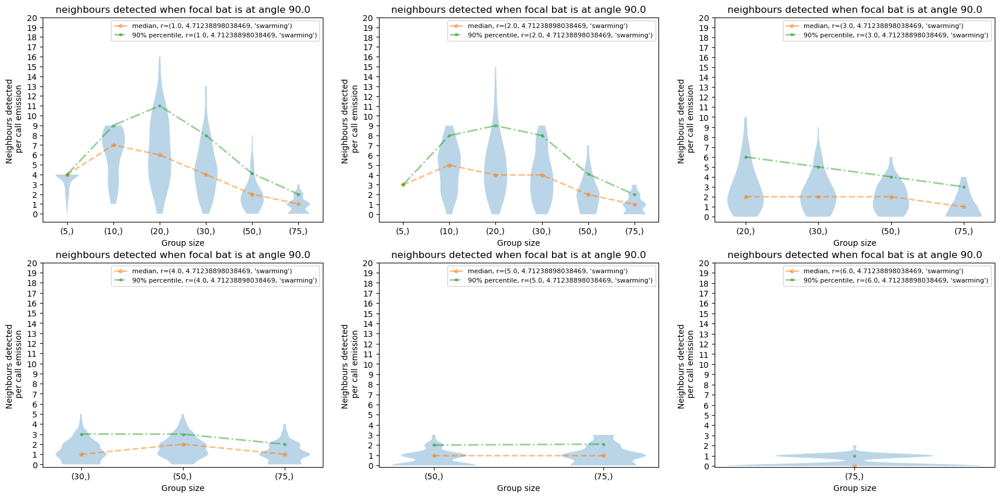

In [18]:
store_info_cleaned= {}
subset= [0,10,30,50, "milling", "swarming"]
for key in subset:
    print(key)
    array_containing_all_simulation_datasets_raw= store_info[key]
    array_containing_all_simulation_datasets=[]
    array_containing_labels= []
    for simulation_data in array_containing_all_simulation_datasets_raw:
        try:
            if simulation_data["focal_bat"][0][2]==key:
                array_containing_all_simulation_datasets.append(simulation_data)
                array_containing_labels.append(simulation_data["focal_bat"][0])
        except KeyError:
            continue
    store_info_cleaned[key]= array_containing_all_simulation_datasets
    array_containing_labels= np.array(array_containing_labels)

    print(array_containing_labels)

    unique_angles_in_dataset= np.unique(array_containing_labels[:,1])
    list_containing_simulated_data_sorted_by_angles= {}
    print(unique_angles_in_dataset)
    for angle in unique_angles_in_dataset:
        list_containing_simulated_data_sorted_by_angles[angle]= []
        sublist_true_false_labels= array_containing_labels[:,1]==angle
        sublist_given_angle= passing_true_false_indices_through_lists(array_containing_all_simulation_datasets, sublist_true_false_labels)
        list_containing_simulated_data_sorted_by_angles[angle].append(sublist_given_angle)
    %matplotlib inline
    i=0
    for angle in list_containing_simulated_data_sorted_by_angles.keys():
        subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]
        print(angle)
        for simulation_data in subset_given_angle:
            plt.plot(simulation_data['group_size'],
                        simulation_data['group_diameter'], 
                    '*',label=simulation_data["focal_bat"][0][0],alpha=0.2)
            i+=1
        plt.legend()
        plt.show()
    iterant1_axis=0
    # fig, axs = plt.subplots(1,3, figsize=(27,9))


    for angle in list_containing_simulated_data_sorted_by_angles.keys():
            subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]; iterant2_color=0
            colors=["blue", "red", "green", "black"]
            plt.figure(figsize=(21,10))
            i=1
            for simulation_data in subset_given_angle:
                    data_by_groupsize = simulation_data.groupby(['group_size'])
                    nbrs_detected_data = {}
                    nbrs_detected_data['num_nbrs'] = []
                    nbrs_detected_data['median_num_nbrs'] = []
                    nbrs_detected_data['90%ile_num_nbrs'] = []
                    groupsizes= []
                    for groupsize, dataframe in data_by_groupsize:
                            groupsizes.append(groupsize)
                            nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                            nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                            nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

                    breakup_x_axis  = np.arange(1,len(groupsizes)+1)+0.5
                    nbrs_detected_data['median_num_nbrs']

                    # plt.figure(figsize=(7,3.42))
                    plt.subplot(2,3,i)
                    plt.violinplot(nbrs_detected_data['num_nbrs'][:], showextrema=False)
                    plt.plot(np.arange(1,len(groupsizes)+1),nbrs_detected_data['median_num_nbrs'][:],
                            '--*',linewidth=2, alpha=0.5,label="median, r="+str(simulation_data["focal_bat"][0]))#'median')
                    # print(np.arange(1,len(groupsizes)))
                    plt.plot(np.arange(1,len(groupsizes)+1), nbrs_detected_data['90%ile_num_nbrs'][:],
                            '-..',linewidth=2, alpha=0.5, label="90% percentile, r="+str(simulation_data["focal_bat"][0]))#label='90%ile')
                    # plt.vlines(breakup_x_axis, -1,20, 'w',linewidth=30,alpha=1.0)
                    plt.yticks(np.arange(0,21,1))
                    plt.xticks(range(1,len(groupsizes)+1),groupsizes[:])
                    plt.legend(fontsize=8)
                    plt.ylabel('Neighbours detected \n per call emission', fontsize=10)
                    plt.xlabel('Group size', fontsize=10)
                    # # plt.ylim(0,20)

                    # axs[i].tight_layout()
                    plt.title("neighbours detected when focal bat is at angle "+str(np.degrees(np.pi/2)))
                    iterant2_color+=1; i+=1
                    
            iterant1_axis+=1
                    # plt.savefig('Figure2_groupsize_1200dpi.pdf',
                    #         bbox_inches='tight', pad_inches=0.05, format='pdf', dpi=1200)
            
            # print(groupsizes); print(nbrs_detected_data['median_num_nbrs'])

# Verticle transect

moving from $(0.75, \frac {3pi}{2})$ to $(0.75, \frac {pi}{2})$ [r, theta] is similar to moving in a ($x=0$) transect centered at the centermost bat.
Note: All the heading vectors are in 90 degree direction ( $\pm$ 10 degree)

In [200]:
tuple([1,1,1])

(1, 1, 1)

In [32]:
key= "swarming"
transect_subsets= [[6.0, 3*np.pi/2, key],[5.0, 3*np.pi/2, key],[4.0, 3*np.pi/2, key],[3.0, 3*np.pi/2, key],[2.0, 3*np.pi/2, key],[1.0, 3*np.pi/2, key],[1.0, np.pi/2, key],[2.0, np.pi/2, key], [3.0, np.pi/2, key], [4.0, np.pi/2, key], [5.0, np.pi/2, key], [6.0, np.pi/2, key]]
transect_subsets= [tuple(i) for i in transect_subsets]
iterant_transect=0
sublist_of_simulation_data_intransect=[]
for r_theta in transect_subsets:
    for simulation_data in array_containing_all_simulation_datasets:
        if simulation_data["focal_bat"][0]==r_theta:
            sublist_of_simulation_data_intransect.append(simulation_data)    

sign_based_on_distance_from_centermost_point= [-1, -1, -1, -1, -1, -1, 0, 1, 1, 1, 1, 1, 1]     
group_sizes= [5,10,20,30,50,75]

In [33]:
sublist_of_simulation_data_intransect_across_heading_var= {}

for heading_var in group_heading_variation:
    sublist_of_simulation_data_intransect=[]
    array_containing_all_simulation_datasets= store_info_cleaned[heading_var]
    key= heading_var
    transect_subsets= [[6.0, 3*np.pi/2, key],[5.0, 3*np.pi/2, key],[4.0, 3*np.pi/2, key],[3.0, 3*np.pi/2, key],[2.0, 3*np.pi/2, key],[1.0, 3*np.pi/2, key],[0.0, 0.0, key],[1.0, np.pi/2, key],[2.0, np.pi/2, key], [3.0, np.pi/2, key], [4.0, np.pi/2, key], [5.0, np.pi/2, key], [6.0, np.pi/2, key]]
    transect_subsets= [tuple(i) for i in transect_subsets]

    for r_theta in transect_subsets:
        for simulation_data in array_containing_all_simulation_datasets:
            if simulation_data["focal_bat"][0]==r_theta:
                sublist_of_simulation_data_intransect.append(simulation_data)    
    sublist_of_simulation_data_intransect_across_heading_var[heading_var]= sublist_of_simulation_data_intransect

In [37]:
sublist_of_simulation_data_intransect_across_heading_var[10][12]["focal_bat"]

0     (6.0, 1.5707963267948966, 10.0)
1     (6.0, 1.5707963267948966, 10.0)
2     (6.0, 1.5707963267948966, 10.0)
3     (6.0, 1.5707963267948966, 10.0)
4     (6.0, 1.5707963267948966, 10.0)
                   ...               
95    (6.0, 1.5707963267948966, 10.0)
96    (6.0, 1.5707963267948966, 10.0)
97    (6.0, 1.5707963267948966, 10.0)
98    (6.0, 1.5707963267948966, 10.0)
99    (6.0, 1.5707963267948966, 10.0)
Name: focal_bat, Length: 100, dtype: object

In [38]:
len(sublist_of_simulation_data_intransect)

13

In [29]:
array_containing_all_simulation_datasets[1]["focal_bat"][0]==[1.0, 3*np.pi/2, key]
float(simulation_data["focal_bat"][0][1])

4.71238898038469

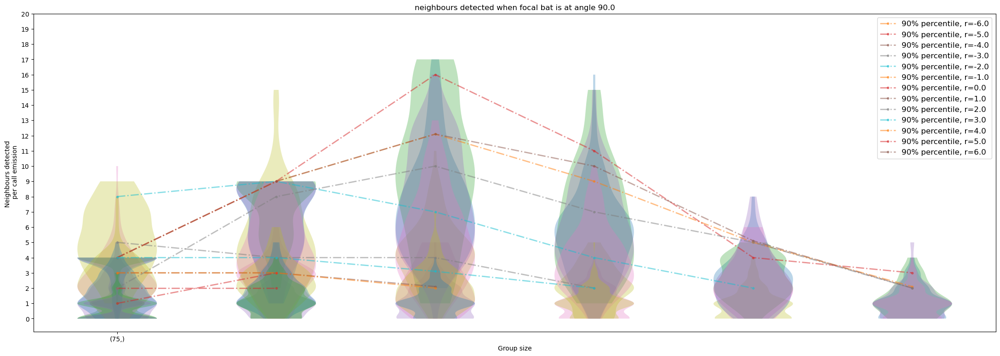

In [34]:
colors=["blue", "red", "green", "black", "pink", "cyan", "yellow"]

fig, axs = plt.subplots(1,1, figsize=(27,9))
iterant2_color=0
for simulation_data in sublist_of_simulation_data_intransect:
        data_by_groupsize = simulation_data.groupby(['group_size'])
        nbrs_detected_data = {}
        nbrs_detected_data['num_nbrs'] = []
        nbrs_detected_data['median_num_nbrs'] = []
        nbrs_detected_data['90%ile_num_nbrs'] = []
        groupsizes= []
        for groupsize, dataframe in data_by_groupsize:
                groupsizes.append(groupsize)
                nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

        breakup_x_axis  = np.arange(1,len(groupsizes)+1)+0.5
        nbrs_detected_data['median_num_nbrs']

        # plt.figure(figsize=(7,3.42))
        # plt.subplot(1,2,i)
        
        axs.violinplot(nbrs_detected_data['num_nbrs'][:], showextrema=False)
        # axs.plot(np.arange(1,len(groupsizes)+1),nbrs_detected_data['median_num_nbrs'][:],
        #         '--*',linewidth=2, alpha=0.5,label="median, r="+str(sign_based_on_distance_from_centermost_point[iterant2_color]*simulation_data["focal_bat"][0][0]), 
        #         color= colors[iterant2_color])#'median')
        # print(np.arange(1,len(groupsizes)))
        axs.plot(np.arange(1,len(groupsizes)+1), nbrs_detected_data['90%ile_num_nbrs'][:],
                '-..',linewidth=2, alpha=0.5, label="90% percentile, r="+str(sign_based_on_distance_from_centermost_point[iterant2_color]*simulation_data["focal_bat"][0][0])
                )#label='90%ile')
        # plt.vlines(breakup_x_axis, -1,20, 'w',linewidth=30,alpha=1.0)
        axs.set_yticks(np.arange(0,21,1))
        axs.set_xticks(range(1,len(groupsizes)+1),groupsizes[:])
        axs.legend(fontsize=12)
        axs.set_ylabel('Neighbours detected \n per call emission', fontsize=10)
        axs.set_xlabel('Group size', fontsize=10)
        # # plt.ylim(0,20)

        # axs[i].tight_layout()
        axs.set_title("neighbours detected when focal bat is at angle "+str(np.degrees(float(simulation_data["focal_bat"][0][1]))))
        iterant2_color+=1
plt.show()

In [40]:
len(sublist_of_simulation_data_intransect_across_heading_var["swarming"])

13

separate the violin plots out for different group sizes to see clear differences between distance from center


/tmp/ipykernel_389842/941302606.py:19: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_389842/941302606.py:19: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_389842/941302606.py:19: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_389842/941302606.py:19: FutureWarning: When group

1
(2.0, 1.5707963267948966, 'milling')


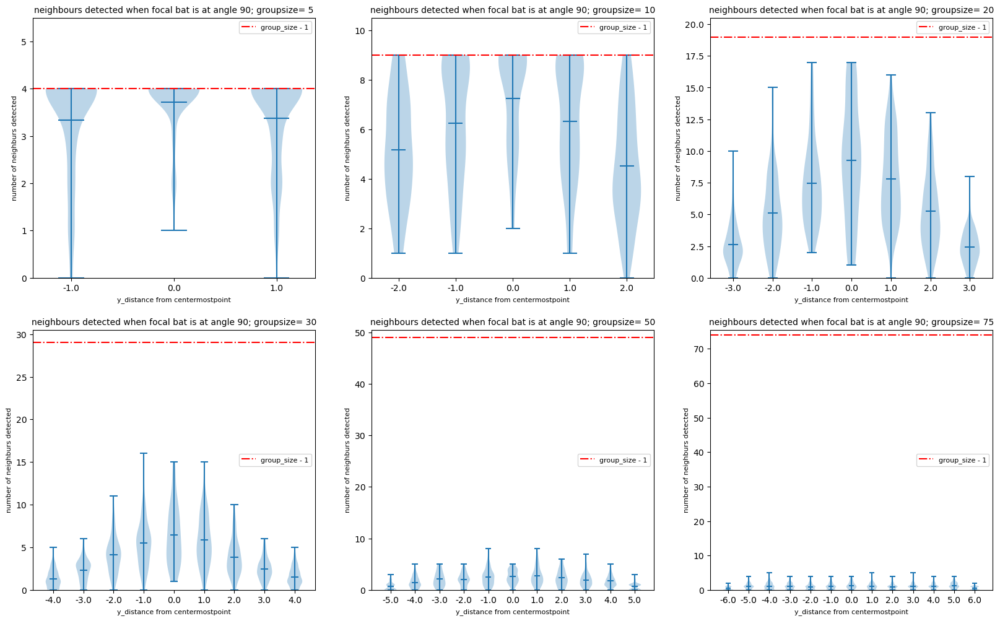

In [46]:
colors=["blue", "red", "green", "black", "pink", "cyan", "yellow"]

# fig, axs = plt.subplots(1,1, figsize=(27,9))
i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(group_sizes)/number_of_columns))
plt.figure(figsize=(20,12))
sublist_of_simulation_data_intransect= sublist_of_simulation_data_intransect_across_heading_var["milling"]
for group_size in group_sizes:
    nbrs_detected_data = {}
    nbrs_detected_data['num_nbrs'] = []
    nbrs_detected_data['median_num_nbrs'] = []
    nbrs_detected_data['90%ile_num_nbrs'] = []
    
    x_ticks= []; iterant_sign=-1
    for simulation_data in sublist_of_simulation_data_intransect:
        iterant_sign+=1

        try:
            dataframe = simulation_data.groupby(['group_size']).get_group(group_size)    
            if len(dataframe["nbrs_detected"])<50:
                print(len(dataframe["nbrs_detected"]))
                print(simulation_data["focal_bat"][0])
                continue
            nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
            nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
            nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))    
        except KeyError:
            continue
        x_ticks.append(sign_based_on_distance_from_centermost_point[iterant_sign]*simulation_data["focal_bat"][0][0])
    

    plt.subplot(number_of_rows,number_of_columns,i+1)
    plt.violinplot(nbrs_detected_data['num_nbrs'], showmeans=True)
    # plt.boxplot(nbrs_detected_data['num_nbrs'], showmeans=True)
    plt.title(f"neighbours detected when focal bat is at angle {90}; groupsize= {group_size}", fontsize= "10")
    plt.xticks(np.arange(1,len(x_ticks)+1),x_ticks)
    # plt.show()
    plt.ylim(0,group_size+0.5)
    plt.axhline(group_size-1, ls="-.", color="red", label= "group_size - 1")
    plt.xlabel("y_distance from centermostpoint", fontsize= "8")
    plt.ylabel("number of neighburs detected", fontsize= "8")
    plt.legend(fontsize= "8")

    i+=1

Zooming into the plots to see finer differences between the diffrent violin plots

/tmp/ipykernel_389842/1371227236.py:17: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_389842/1371227236.py:17: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_389842/1371227236.py:17: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_389842/1371227236.py:17: FutureWarning: When g

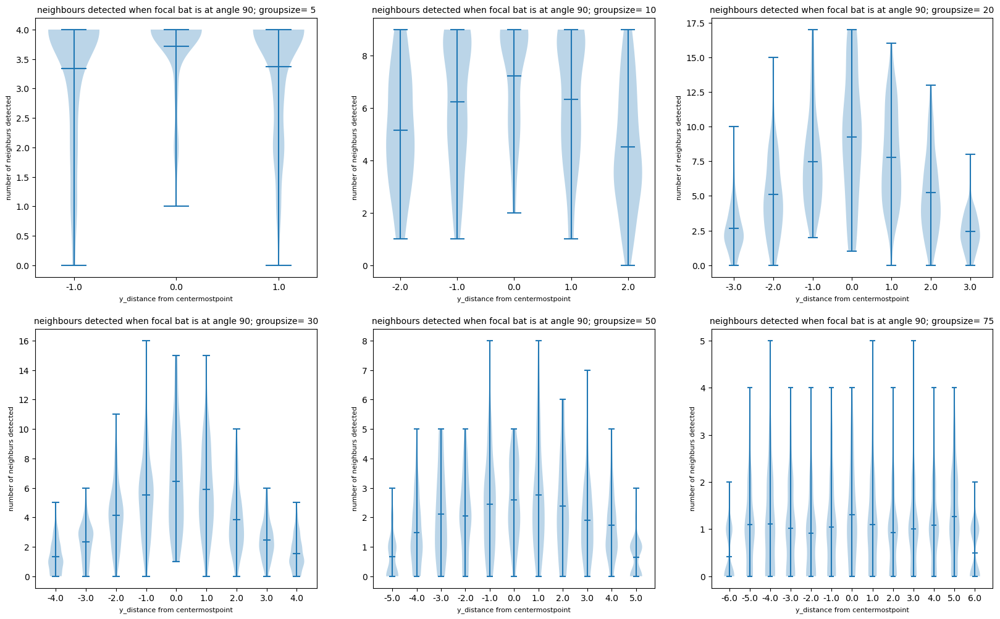

In [47]:
colors=["blue", "red", "green", "black", "pink", "cyan", "yellow"]

# fig, axs = plt.subplots(1,1, figsize=(27,9))
i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(group_sizes)/number_of_columns))
plt.figure(figsize=(20,12))
for group_size in group_sizes:
    nbrs_detected_data = {}
    nbrs_detected_data['num_nbrs'] = []
    nbrs_detected_data['median_num_nbrs'] = []
    nbrs_detected_data['90%ile_num_nbrs'] = []
    
    x_ticks= []; iterant_sign=-1
    for simulation_data in sublist_of_simulation_data_intransect:
        iterant_sign+=1
        try:
            dataframe = simulation_data.groupby(['group_size']).get_group(group_size)    
            if len(dataframe["nbrs_detected"])<50:
                continue
            nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
            nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
            nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))    
        except KeyError:
            continue
        x_ticks.append(sign_based_on_distance_from_centermost_point[iterant_sign]*simulation_data["focal_bat"][0][0])

        

    plt.subplot(number_of_rows,number_of_columns,i+1)
    plt.violinplot(nbrs_detected_data['num_nbrs'], showmeans=True)
    # plt.boxplot(nbrs_detected_data['num_nbrs'], showmeans=True)
    plt.title(f"neighbours detected when focal bat is at angle {90}; groupsize= {group_size}", fontsize= "10")
    plt.xticks(np.arange(1,len(x_ticks)+1),x_ticks)
    # plt.show()
    # plt.ylim(0,group_size+0.5)
    # plt.axhline(group_size-1, ls="-.", color="red", label= "group_size - 1")
    plt.xlabel("y_distance from centermostpoint", fontsize= "8")
    plt.ylabel("number of neighburs detected", fontsize= "8")
    # plt.legend(fontsize= "8")

    i+=1

The number of neighbours detected shows an increase with group size initially and then drops sharply down beyond 30 bats. 


### How does the probability of detecting at least one neighbour change with group size?

In [25]:
def calculate_geqNneighbour(num_detected_neighbours, N):
    '''Calculates the proportion of an array-like
    object that is >= N.
    
    '''
    geq_N = np.float64(np.sum(num_detected_neighbours>=N))
    if np.isnan(np.min(num_detected_neighbours)):
        return np.nan
    proportion_geq_N = geq_N/len(num_detected_neighbours)
    return(proportion_geq_N)

In [63]:
simulation_data.keys()

Index(['nbrs_detected', 'group_size', 'group_diameter',
       'nearest_neighbour_distance', 'nbrs_detected_distance', 'uuid', 'seed',
       'paramset_id', 'parameters_joint', 'echo_levels', 'detection_azimuth',
       'heading_variation', 'echocall_duration', 'atmospheric_attenuation',
       'min_spacing', 'source_level', 'interpulse_interval',
       'implement_shadowing', 'focal_bat'],
      dtype='object')

In [49]:
#store data
store_nbrs_across_heading_var= {} #key is heading var
for heading_var in group_heading_variation:
        store_probability_of_detection_n_neighbour= {}
        group_sizes= [5,10,20,30,50,75]
        i=0
        sublist_of_simulation_data_intransect= sublist_of_simulation_data_intransect_across_heading_var[heading_var]
        for simulation_data in sublist_of_simulation_data_intransect:
                data_by_groupsize = simulation_data.groupby(['group_size'])

                nbrs_detected_data = {}
                nbrs_detected_data["group_sizes"]= group_sizes
                nbrs_detected_data['num_nbrs'] = []
                nbrs_detected_data['median_num_nbrs'] = []
                nbrs_detected_data['90%ile_num_nbrs'] = []
                nbrs_detected_data['detected_distances'] = []
                nbrs_detected_data['neighbours_azimuth'] = []
                nbrs_detected_data['echolevels'] = []
                groupsizes= []

                for groupsize, dataframe in data_by_groupsize:
                        if len(dataframe)<50:
                                print(len(dataframe))
                                continue
                        groupsizes.append(groupsize[0])
                        nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                        nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                        nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

                        nbrs_detected_data['detected_distances'].append(np.concatenate(np.array(dataframe['nbrs_detected_distance'])))

                        nbrs_detected_data['neighbours_azimuth'].append(np.concatenate(np.array(dataframe['detection_azimuth'])))

                        nbrs_detected_data['echolevels'].append(np.concatenate(np.array(dataframe['echo_levels'])))

                nan_groupsizes= [i for i in group_sizes if i not in groupsizes]

                for nan_groupsize in nan_groupsizes:
                        nbrs_detected_data['num_nbrs']= [np.nan, *nbrs_detected_data['num_nbrs']]
                        nbrs_detected_data['median_num_nbrs']= [np.nan, *nbrs_detected_data['median_num_nbrs']]
                        nbrs_detected_data['90%ile_num_nbrs']= [np.nan, *nbrs_detected_data['90%ile_num_nbrs']]

                nbrs_detected_data['0neighbours'] = [ 1-calculate_geqNneighbour(each,1)  for each in nbrs_detected_data['num_nbrs']]
                nbrs_detected_data['geq_1neighbour'] = [ calculate_geqNneighbour(each,1)  for each in nbrs_detected_data['num_nbrs']]
                nbrs_detected_data['geq_2neighbour'] = [ calculate_geqNneighbour(each,2)  for each in nbrs_detected_data['num_nbrs']]
                nbrs_detected_data['geq_3neighbour'] = [ calculate_geqNneighbour(each,3)  for each in nbrs_detected_data['num_nbrs']]
                nbrs_detected_data['geq_4neighbour'] = [ calculate_geqNneighbour(each,4)  for each in nbrs_detected_data['num_nbrs']]

                # nbrs_detected_data['detected_distances'] = [ np.concatenate(np.array(dataframe['nbrs_detected_distance'])) for groupsize, dataframe in data_by_groupsize]
                nbrs_detected_data['median_detected_distances'] = map(np.median, nbrs_detected_data['detected_distances'])
                nbrs_detected_data['90%ile_detected_distances'] = map(lambda X : np.percentile(X,90),
                                                                nbrs_detected_data['detected_distances'][:-1])

                # nbrs_detected_data['neighbours_azimuth'] = [ np.concatenate(np.array(dataframe['detection_azimuth'])) for groupsize, dataframe in data_by_groupsize]
                nbrs_detected_data['median_neighbours_azimuth'] = [ np.median(each)  for each in nbrs_detected_data['neighbours_azimuth'] ]
                nbrs_detected_data['95%ile_neighbours_azimuth'] = [ np.percentile(each, 97.5)  for each in nbrs_detected_data['neighbours_azimuth'][:-1] ]
                nbrs_detected_data['5%ile_neighbours_azimuth'] = [ np.percentile(each, 2.5)  for each in nbrs_detected_data['neighbours_azimuth'][:-1] ]

                # nbrs_detected_data['echolevels'] = [ np.concatenate(np.array(dataframe['echo_levels'])) for groupsize, dataframe in data_by_groupsize]
                nbrs_detected_data['median_echolevels'] = [ np.median(each) for each in nbrs_detected_data['echolevels']]
                nbrs_detected_data['5%ile_echolevels'] = [ np.percentile(each, 2.5) for each in nbrs_detected_data['echolevels'][:-1]]
                nbrs_detected_data['95%ile_echolevels'] = [ np.percentile(each, 97.5) for each in nbrs_detected_data['echolevels'][:-1]]

                for nan_groupsize in nan_groupsizes:
                        nbrs_detected_data['detected_distances']= [np.nan, *nbrs_detected_data['detected_distances']]
                        nbrs_detected_data['median_detected_distances']= [np.nan, *nbrs_detected_data['median_detected_distances']]
                        nbrs_detected_data['90%ile_detected_distances']= [np.nan, *nbrs_detected_data['90%ile_detected_distances']]

                        nbrs_detected_data['neighbours_azimuth']= [[np.nan], *nbrs_detected_data['neighbours_azimuth']]
                        nbrs_detected_data['median_neighbours_azimuth']= [np.nan, *nbrs_detected_data['median_neighbours_azimuth']]
                        nbrs_detected_data['5%ile_neighbours_azimuth']= [np.nan, *nbrs_detected_data['5%ile_neighbours_azimuth']]
                        nbrs_detected_data['95%ile_neighbours_azimuth']= [np.nan, *nbrs_detected_data['95%ile_neighbours_azimuth']]

                        nbrs_detected_data['echolevels']= [[np.nan], *nbrs_detected_data['echolevels']]
                        nbrs_detected_data['median_echolevels']= [np.nan, *nbrs_detected_data['median_echolevels']]
                        nbrs_detected_data['5%ile_echolevels']= [np.nan, *nbrs_detected_data['5%ile_echolevels']]
                        nbrs_detected_data['95%ile_echolevels']= [np.nan, *nbrs_detected_data['95%ile_echolevels']]
                        
                
                store_probability_of_detection_n_neighbour[simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]]= nbrs_detected_data
                i+=1
        store_nbrs_across_heading_var[heading_var]= store_probability_of_detection_n_neighbour

2
1
1
1
3
1
1
1


In [212]:
store_nbrs_across_heading_var["milling"]

{-6.0: {'group_sizes': [5, 10, 20, 30, 50, 75],
  'num_nbrs': [nan,
   nan,
   nan,
   nan,
   nan,
   array([0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1,
          1, 1, 1, 1, 0, 2, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
          1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1,
          0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1,
          1, 0, 0, 0, 0, 0, 0, 2, 1, 0, 1, 1])],
  'median_num_nbrs': [nan, nan, nan, nan, nan, np.float64(0.0)],
  '90%ile_num_nbrs': [nan, nan, nan, nan, nan, np.float64(1.0)],
  'detected_distances': [nan,
   nan,
   nan,
   nan,
   nan,
   array([0.63578546, 0.58518082, 0.58579685, 0.56047984, 0.73994231,
          0.65997563, 0.51996969, 0.60185078, 0.63794003, 0.67724586,
          0.55671536, 0.50376095, 0.64055851, 0.53702641, 0.5084076 ,
          0.58864802, 0.53480981, 0.78011995, 0.50242064, 0.70694527,
          0.58776315, 0.5028513 , 0.52118863, 0.63319586, 0.52074359,
     

In [191]:
store_nbrs_across_heading_var["swarming"]

{-6.0: {'group_sizes': [5, 10, 20, 30, 50, 75],
  'num_nbrs': [nan,
   nan,
   nan,
   nan,
   nan,
   array([0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1,
          0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1,
          1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 2, 0, 1, 1, 0,
          0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0])],
  'median_num_nbrs': [nan, nan, nan, nan, nan, np.float64(0.0)],
  '90%ile_num_nbrs': [nan, nan, nan, nan, nan, np.float64(1.0)],
  'detected_distances': [nan,
   nan,
   nan,
   nan,
   nan,
   array([0.50771068, 0.90115966, 0.54076344, 0.5473137 , 0.61949485,
          0.71394918, 0.58515067, 0.94623025, 0.50219351, 0.57017459,
          0.60080011, 0.60900886, 0.57705657, 0.62694038, 0.68525329,
          0.62315059, 0.50106944, 0.53003374, 0.55630798, 0.53585435,
          0.52740476, 0.59268599, 0.54281062, 0.75211819, 0.50943213,
     

In [214]:
heading_var= "milling"

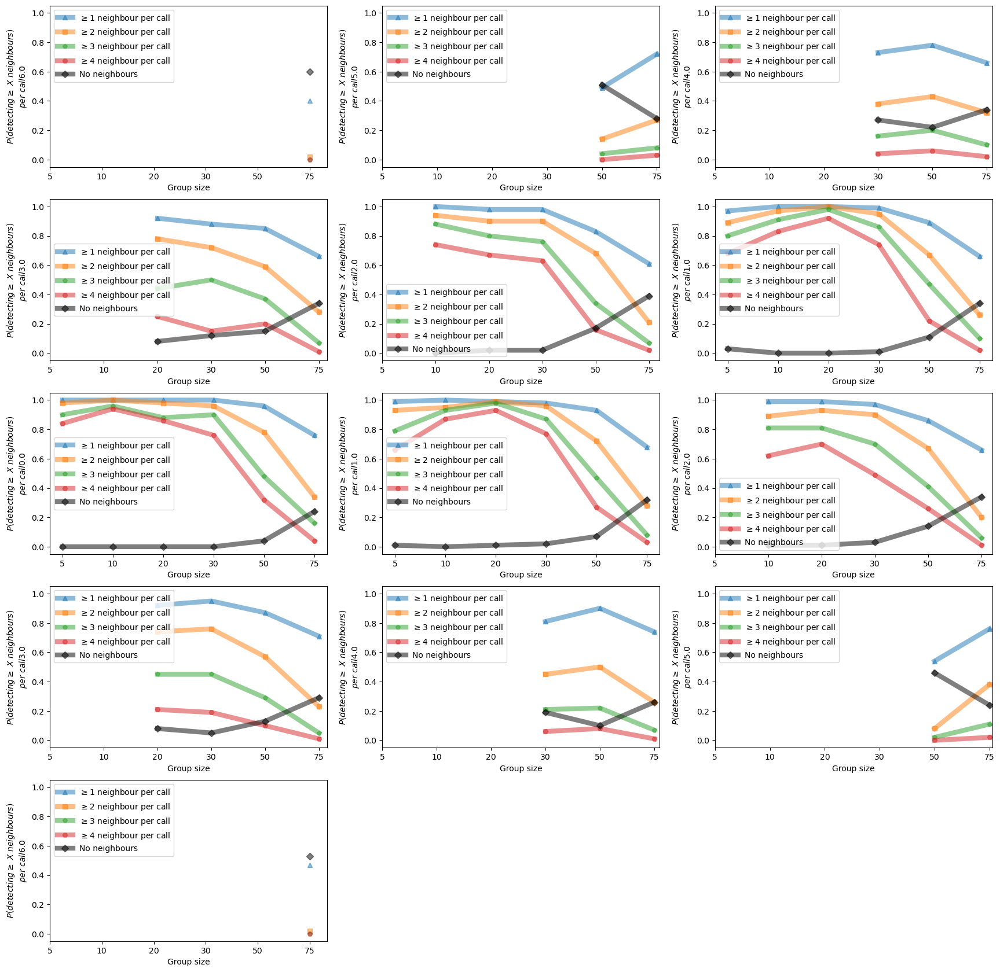

In [50]:
store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[heading_var]
i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(sublist_of_simulation_data_intransect)/number_of_columns))
plt.figure(figsize= (21,21))
for simulation_data in sublist_of_simulation_data_intransect:
        data_by_groupsize = simulation_data.groupby(['group_size'])
        groupsizes= group_sizes

        key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
        nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['geq_1neighbour'], '-^', linewidth=6, alpha=0.5, label='$\geq1$ neighbour per call')
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['geq_2neighbour'], '-s', linewidth=6, alpha=0.5, label='$\geq2$ neighbour per call')
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['geq_3neighbour'], '-p', linewidth=6, alpha=0.5, label='$\geq3$ neighbour per call')
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['geq_4neighbour'], '-H', linewidth=6, alpha=0.5, label='$\geq4$ neighbour per call')
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['0neighbours'], '-Dk', linewidth=6, alpha=0.5, label='No neighbours')

        plt.yticks(fontsize=10)
        plt.xticks(np.arange(1,len(groupsizes)+1),
                groupsizes,fontsize=10)
        plt.legend()
        plt.ylabel('$P(detecting \geq \ X \ neighbours)$'+'\n'+ '$per \ call$'+str(simulation_data["focal_bat"][0][0]),
                fontsize=10)
        plt.xlabel('Group size',
                fontsize=10)
        plt.ylim(-0.05,1.05)
        
        i+=1

In [51]:
print(group_heading_variation)
j=0
plt.figure(figsize= (100,100))
for heading_var in group_heading_variation:
        
        store_probability_of_detection_n_neighbour = store_nbrs_across_heading_var[heading_var]
        number_of_neighbours_atleast_detected= [0,1,2,3,4]
        i=0; 
        number_of_columns=5; number_of_rows= 6#int(np.ceil(len(number_of_neighbours_atleast_detected)/number_of_columns))
        

        for simulation_data in sublist_of_simulation_data_intransect:
                color_given_index= colors[int(float(simulation_data["focal_bat"][0][0]))-1]
                groupsizes= group_sizes

                key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
                # print(key_for_dict)
                # print(simulation_data["focal_bat"][0][0])
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

                if sign_based_on_distance_from_centermost_point[i]<0:
                        ls= ".-"
                else:
                        ls= "--"

                plt.subplot(number_of_rows,number_of_columns,2+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_1neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color= color_given_index, lw=8)
                
                plt.subplot(number_of_rows,number_of_columns,3+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_2neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index, lw=8)
                
                plt.subplot(number_of_rows,number_of_columns,4+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_3neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index, lw=8)
                
                plt.subplot(number_of_rows,number_of_columns,5+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_4neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index, lw=8)
                
                plt.subplot(number_of_rows,number_of_columns,1+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['0neighbours'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index, lw=8)
                i+=1
        for i in range(1,6):
                if i==1:
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\leq{i-1}$ neighbour per call;")
                else: 
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\geq{i-1}$ neighbour per call;")
                plt.ylabel('$P(detecting \geq \ X \ neighbours)$'+'\n'+ '$per \ call$'+str(simulation_data["focal_bat"][0][0]),
                        fontsize=10)
                plt.xlabel('Group size',
                        fontsize=10)
                plt.ylim(-0.05,1.05)
        j+=1
plt.show()

[0, 10, 30, 50, 'swarming', 'milling']


In [52]:
nbrs_detected_data['0neighbours']

[nan, nan, nan, nan, nan, np.float64(0.53)]

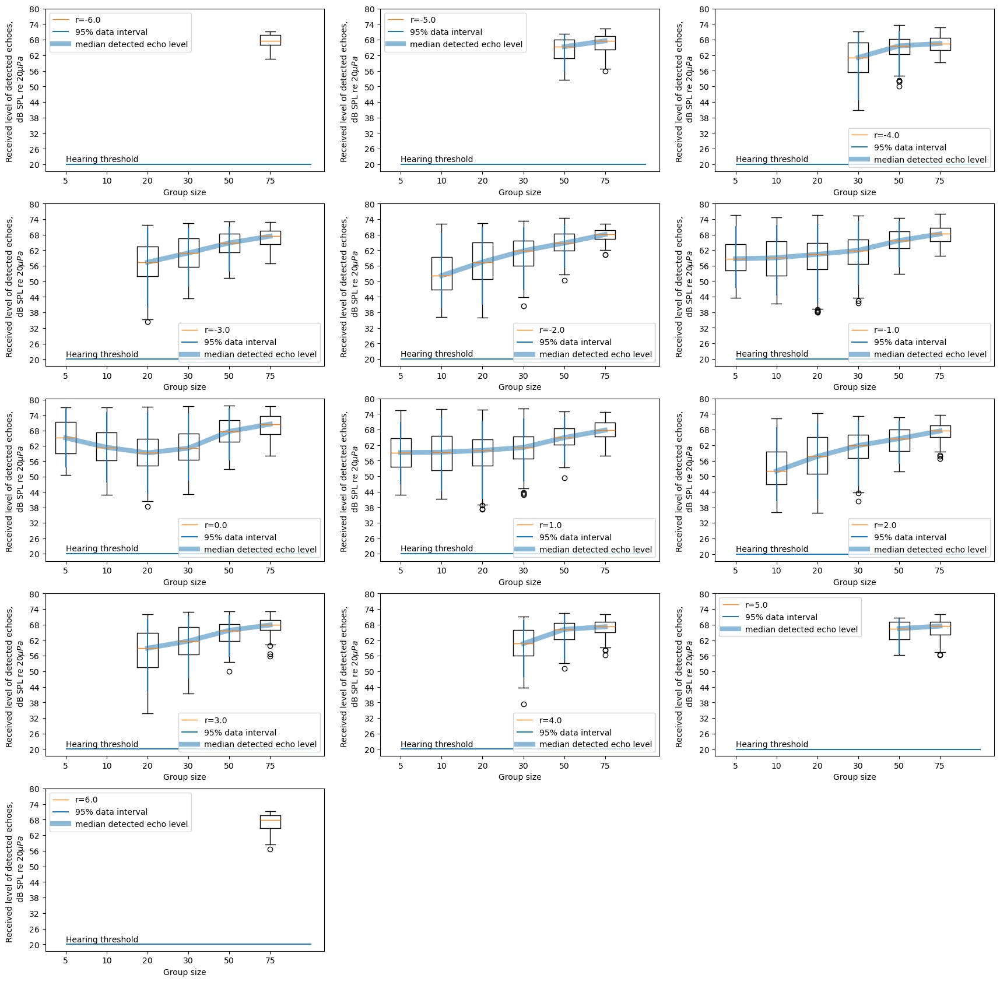

In [53]:

i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(sublist_of_simulation_data_intransect)/number_of_columns))
plt.figure(figsize= (21,21))
for simulation_data in sublist_of_simulation_data_intransect:
        groupsizes= group_sizes
        key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
        nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]
        # print(nbrs_detected_data['median_echolevels'])
        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.boxplot(nbrs_detected_data['echolevels'][:], label=f"r={key_for_dict}");
        plt.vlines(range(1,len(nbrs_detected_data['95%ile_echolevels'])+1),nbrs_detected_data['5%ile_echolevels'],
                                                                        nbrs_detected_data['95%ile_echolevels'],
                                label='95% data interval')

        plt.plot(range(1,len(groupsizes)+1), nbrs_detected_data['median_echolevels'], linewidth=6, alpha=0.5,
                label='median detected echo level')
        plt.ylabel('Received level of detected echoes, \n dB SPL re 20$\mu Pa$',
                                                fontsize=10)
        plt.xticks(np.arange(1,len(groupsizes)+1), groupsizes, fontsize=10)
        plt.hlines([20],1,len(groupsizes)+1)
        plt.yticks(np.arange(20,86,6),np.arange(20,86,6), fontsize=10)
        plt.text(1,21,'Hearing threshold', fontsize=10)
        plt.xlabel('Group size', fontsize=10)
        plt.legend()
        # print(key_f
        # or_dict)
        i+=1

/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


6.0


/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend. 

6.0
6.0
6.0
6.0
6.0


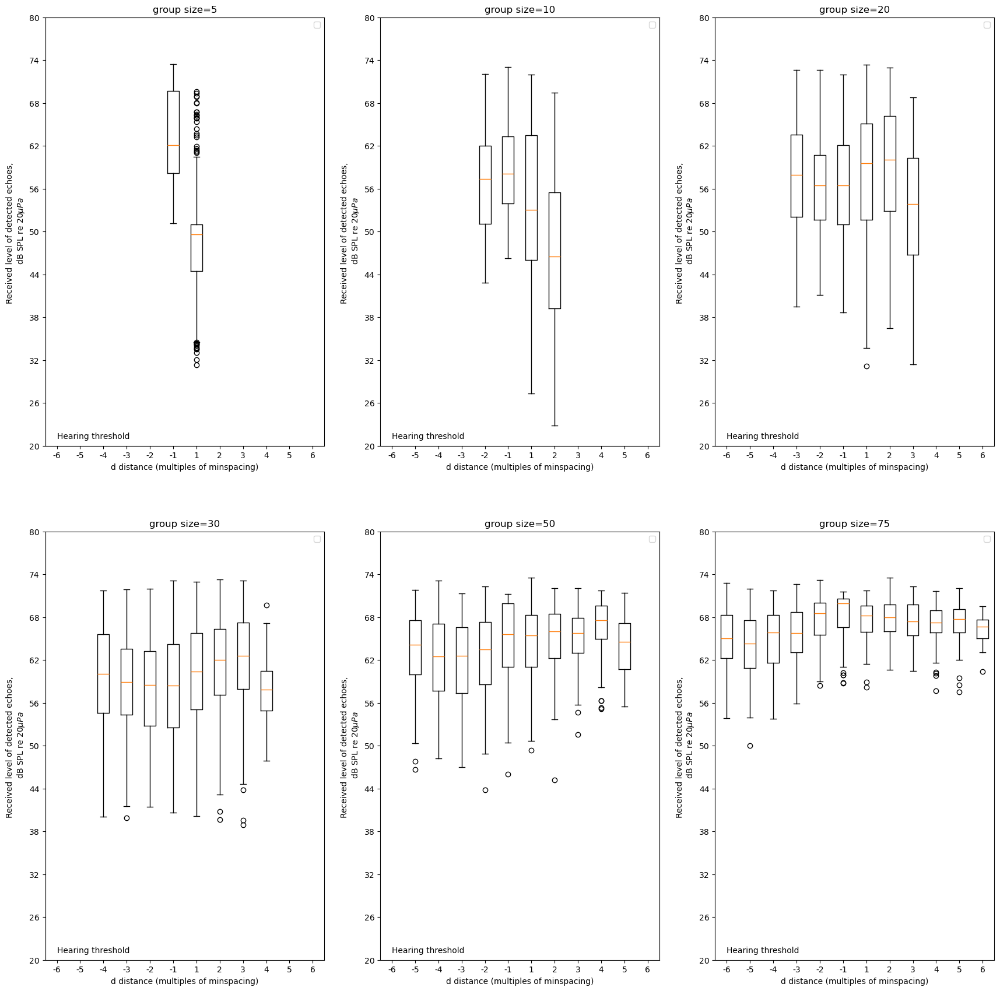

In [234]:
store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[10]
i=0; 

d_distances_along_transect= np.arange(-6,7,1)
number_of_columns=3; number_of_rows= int(np.ceil(len(group_sizes)/number_of_columns))
plt.figure(figsize= (21,21))
for group_size in group_sizes:
        array_storing_info_for_plot= []
        iterant_sign=-1
        x_ticks=[]
        for key in d_distances_along_transect:
                if key==0:
                        continue
                iterant_sign+=1
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key]
                data_to_store= nbrs_detected_data['echolevels'][group_sizes.index(group_size)]
                array_storing_info_for_plot.append(data_to_store)
                x_ticks.append(key)

        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.boxplot(array_storing_info_for_plot);

        plt.ylabel('Received level of detected echoes, \n dB SPL re 20$\mu Pa$',
                                                fontsize=10)
        plt.xticks(np.arange(1,len(x_ticks)+1), x_ticks, fontsize=10)
        plt.yticks(np.arange(20,86,6),np.arange(20,86,6), fontsize=10)
        plt.text(1,21,'Hearing threshold', fontsize=10)
        plt.xlabel('d distance (multiples of minspacing)', fontsize=10)
        plt.legend()
        plt.title(f"group size={group_size}")
        print(key_for_dict)
        i+=1

In [81]:
store_probability_of_detection_n_neighbour.keys()

dict_keys([-6.0, -5.0, -4.0, -3.0, -2.0, -1.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0])

-6.0
-5.0
-4.0
-3.0
-2.0
-1.0
1.0
2.0
3.0
4.0
5.0
6.0


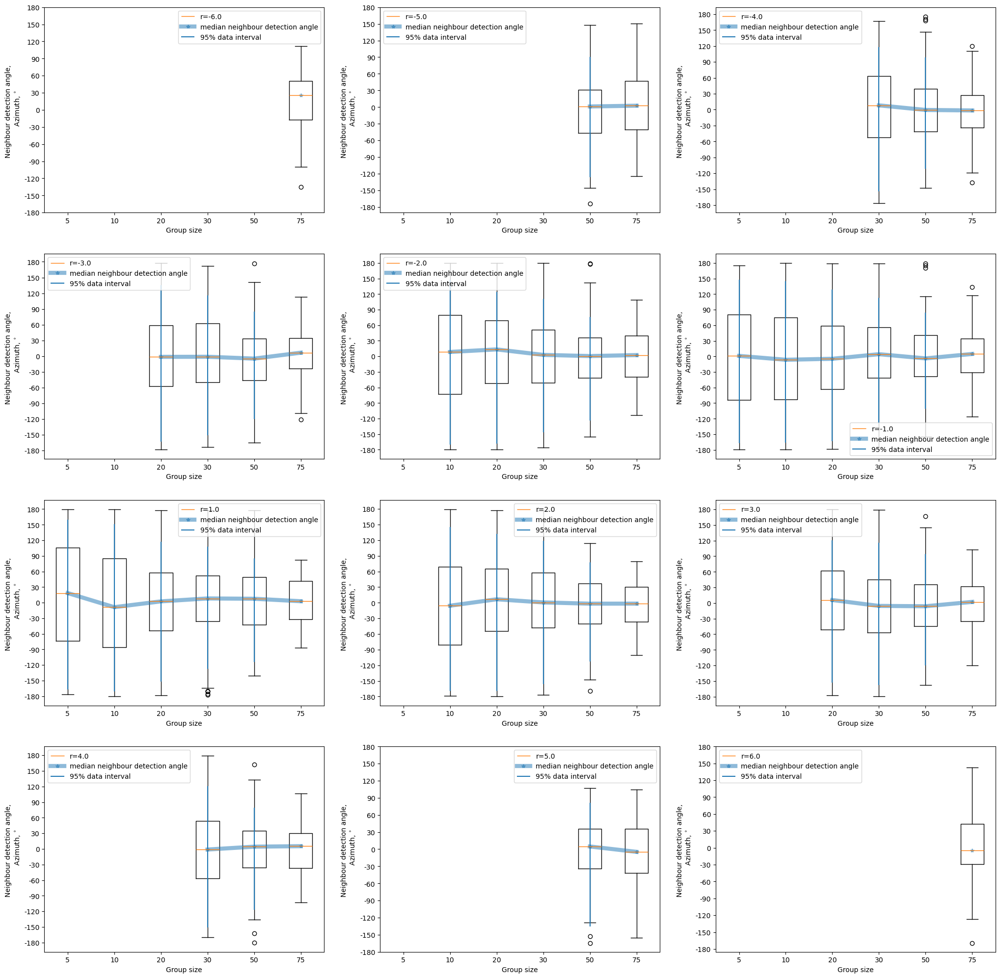

In [82]:
i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(sublist_of_simulation_data_intransect)/number_of_columns))
plt.figure(figsize= (25,25))
for simulation_data in sublist_of_simulation_data_intransect:
        groupsizes= group_sizes
        key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
        nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.boxplot(nbrs_detected_data['neighbours_azimuth'][:], label=f"r={key_for_dict}")
        plt.plot(np.arange(1,7), nbrs_detected_data['median_neighbours_azimuth'], '-*', linewidth=6,
                        alpha=0.5, label='median neighbour detection angle')
        plt.vlines(range(1,len(nbrs_detected_data['5%ile_neighbours_azimuth'])+1),nbrs_detected_data['5%ile_neighbours_azimuth'],
                nbrs_detected_data['95%ile_neighbours_azimuth'], label='95% data interval')
        #plt.plot(np.arange(1,8), nbrs_detected_data['95%ile_neighbours_azimuth'], 'g')
        #plt.plot(np.arange(1,8), nbrs_detected_data['5%ile_neighbours_azimuth'], 'g', label='95%  neighbour detection range')

        plt.yticks(np.arange(-180,210,30), np.arange(-180,210,30), fontsize=10)
        plt.xticks(np.arange(1,7), group_sizes, fontsize=10)
        plt.legend()
        plt.ylabel('Neighbour detection angle, \n  Azimuth, $^{\circ}$', fontsize=10)
        plt.xlabel('Group size', fontsize=10)


        print(key_for_dict)
        i+=1

(array([10., 20., 18., 31., 21., 24., 25., 19.,  9.,  4.]),
 array([-110.6244 ,  -86.20075,  -61.7771 ,  -37.35345,  -12.9298 ,
          11.49385,   35.9175 ,   60.34115,   84.7648 ,  109.18845,
         133.6121 ]),
 <BarContainer object of 10 artists>)

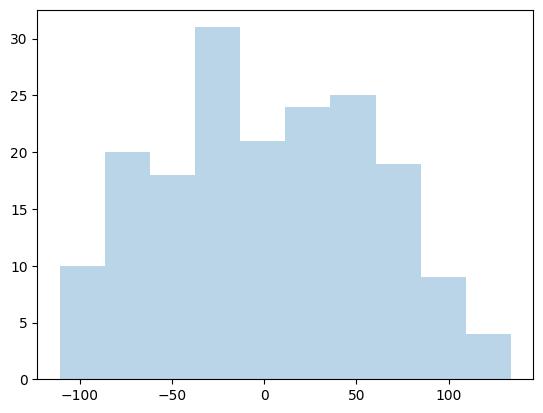

In [ ]:
nbrs_detected_data= store_probability_of_detection_n_neighbour[3]
plt.hist(nbrs_detected_data['neighbours_azimuth'][4], alpha=0.3)
# print(np.sum(plt.hist(nbrs_detected_data['neighbours_azimuth'][6])[0]))

/tmp/ipykernel_224483/3498775721.py:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/3498775721.py:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/3498775721.py:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/3498775721.py:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/3498775721.py:28: UserWarning: No artists with labels found to put in legend. 

6.0
6.0
6.0
6.0
6.0
6.0


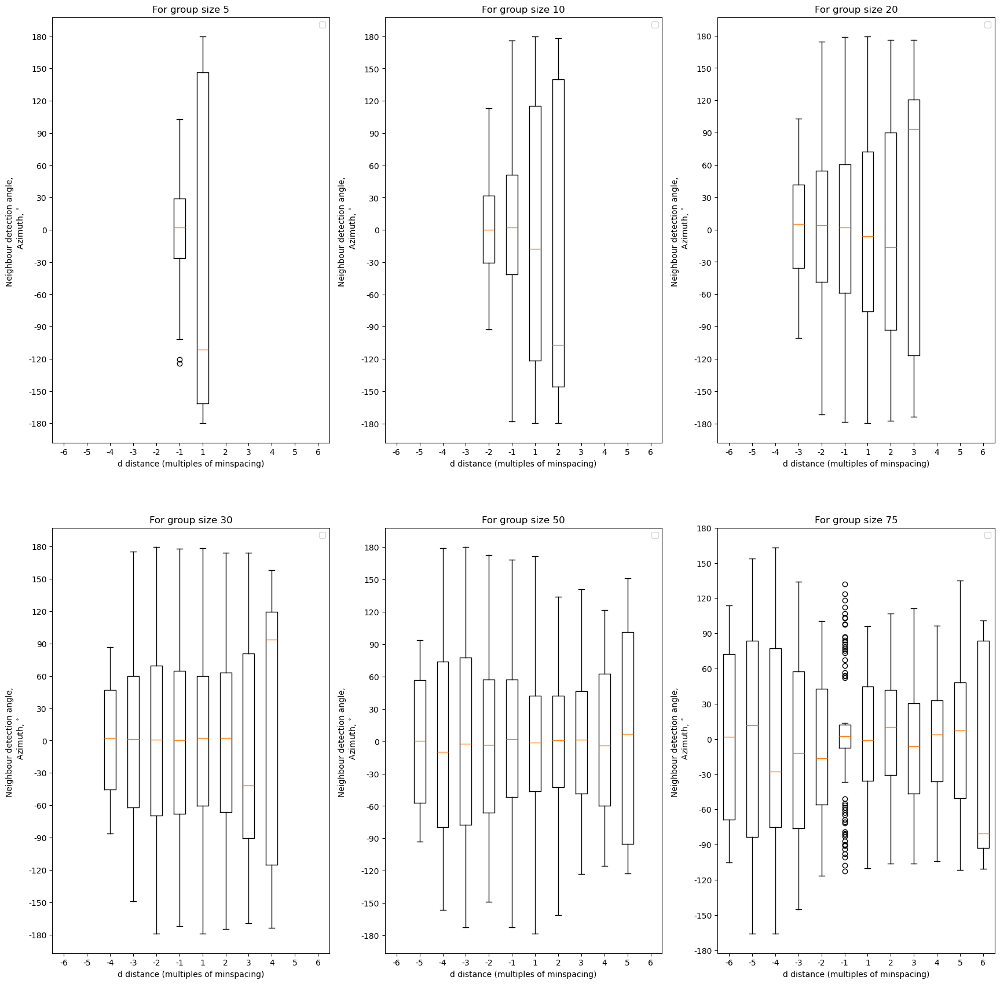

In [235]:
store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[10]
i=0; 
d_distances_along_transect= np.arange(-6,7,1)
number_of_columns=3; number_of_rows= int(np.ceil(len(group_sizes)/number_of_columns))
plt.figure(figsize= (21,21))
for group_size in group_sizes:
        array_storing_info_for_plot= []
        iterant_sign=-1
        x_ticks=[]
        for key in d_distances_along_transect:
                if key==0:
                        continue
                iterant_sign+=1
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key]
                data_to_store= nbrs_detected_data['neighbours_azimuth'][group_sizes.index(group_size)]
                array_storing_info_for_plot.append(data_to_store)
                x_ticks.append(key)

        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.boxplot(array_storing_info_for_plot);

        plt.yticks(np.arange(-180,210,30), np.arange(-180,210,30), fontsize=10)
        plt.xticks(np.arange(1,len(x_ticks)+1), x_ticks, fontsize=10)

        plt.ylabel('Neighbour detection angle, \n  Azimuth, $^{\circ}$', fontsize=10)
        plt.xlabel('d distance (multiples of minspacing)', fontsize=10)
        plt.title(f"For group size {group_size}")
        plt.legend()
        print(key_for_dict)
        i+=1

In [55]:
def modify_dict_for_seaborn(input_dict,key_x,key_y):
    radial_dist= input_dict.keys()
    x,y,hue= [], [], []
    for r in radial_dist:
        data_to_plotted= input_dict[r]
        y_axis_raw= data_to_plotted[key_y]
        x_axis_raw= data_to_plotted[key_x]

        for index_group_sizes in range(len(x_axis_raw)):
            group_size= x_axis_raw[index_group_sizes]
            y_corresponding_to_group_size= y_axis_raw[index_group_sizes]
            # print(y_corresponding_to_group_size)
            for entry in y_corresponding_to_group_size:
                y.append(entry)
                x.append(group_size)
                hue.append(r)

    return x,y,hue

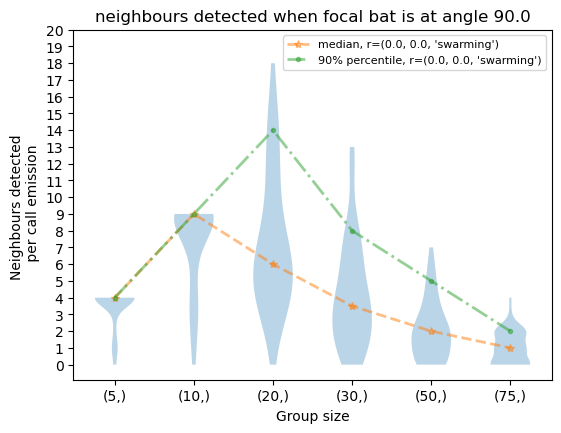

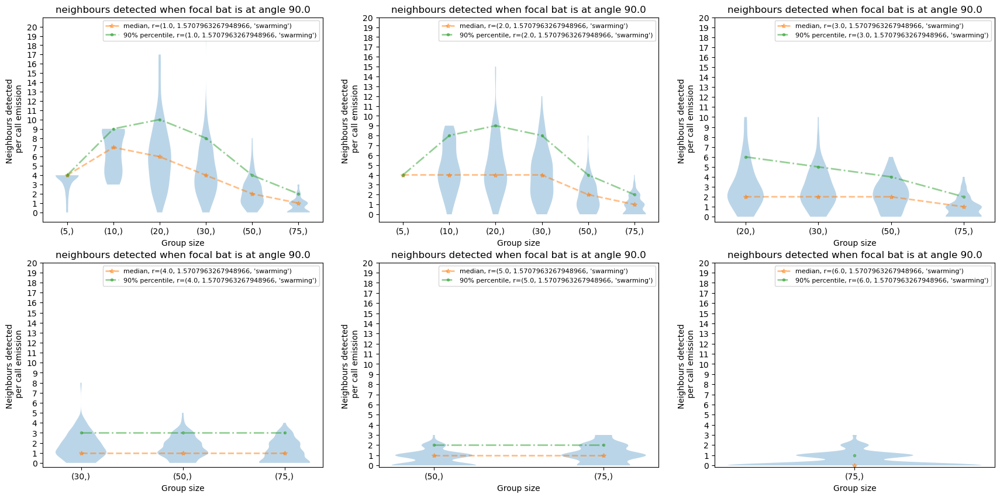

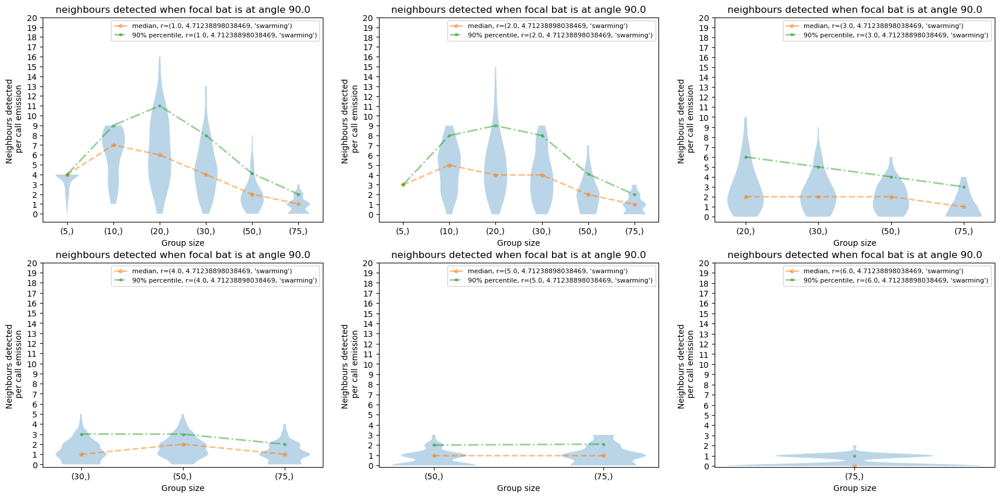

In [54]:
iterant1_axis=0
# fig, axs = plt.subplots(1,3, figsize=(27,9))


for angle in list_containing_simulated_data_sorted_by_angles.keys():
        subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]; iterant2_color=0
        
        plt.figure(figsize=(21,10))
        i=1
        for simulation_data in subset_given_angle:
                data_by_groupsize = simulation_data.groupby(['group_size'])
                nbrs_detected_data = {}
                nbrs_detected_data['num_nbrs'] = []
                nbrs_detected_data['median_num_nbrs'] = []
                nbrs_detected_data['90%ile_num_nbrs'] = []
                groupsizes= []
                for groupsize, dataframe in data_by_groupsize:
                        groupsizes.append(groupsize)
                        nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                        nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                        nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

                breakup_x_axis  = np.arange(1,len(groupsizes)+1)+0.5
                nbrs_detected_data['median_num_nbrs']

                # plt.figure(figsize=(7,3.42))
                plt.subplot(2,3,i)
                plt.violinplot(nbrs_detected_data['num_nbrs'][:], showextrema=False)
                plt.plot(np.arange(1,len(groupsizes)+1),nbrs_detected_data['median_num_nbrs'][:],
                        '--*',linewidth=2, alpha=0.5,label="median, r="+str(simulation_data["focal_bat"][0]))#'median')
                # print(np.arange(1,len(groupsizes)))
                plt.plot(np.arange(1,len(groupsizes)+1), nbrs_detected_data['90%ile_num_nbrs'][:],
                        '-..',linewidth=2, alpha=0.5, label="90% percentile, r="+str(simulation_data["focal_bat"][0]))#label='90%ile')
                # plt.vlines(breakup_x_axis, -1,20, 'w',linewidth=30,alpha=1.0)
                plt.yticks(np.arange(0,21,1))
                plt.xticks(range(1,len(groupsizes)+1),groupsizes[:])
                plt.legend(fontsize=8)
                plt.ylabel('Neighbours detected \n per call emission', fontsize=10)
                plt.xlabel('Group size', fontsize=10)
                # # plt.ylim(0,20)

                # axs[i].tight_layout()
                plt.title("neighbours detected when focal bat is at angle "+str(np.degrees(np.pi/2)))
                iterant2_color+=1; i+=1
                
        iterant1_axis+=1
                # plt.savefig('Figure2_groupsize_1200dpi.pdf',
                #         bbox_inches='tight', pad_inches=0.05, format='pdf', dpi=1200)
        
        # print(groupsizes); print(nbrs_detected_data['median_num_nbrs'])

In [58]:
import seaborn as sns

In [69]:
store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[0]
x,y,hue= modify_dict_for_seaborn(store_probability_of_detection_n_neighbour, "group_sizes", "neighbours_azimuth")
y_sublist= [y[i] for i in range(len(x)) if x[i]==50]

In [71]:
len(y_sublist)

2023

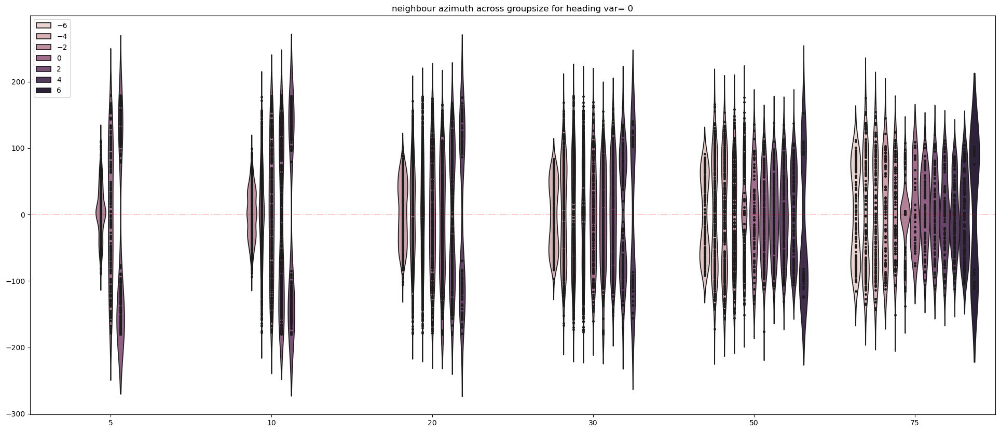

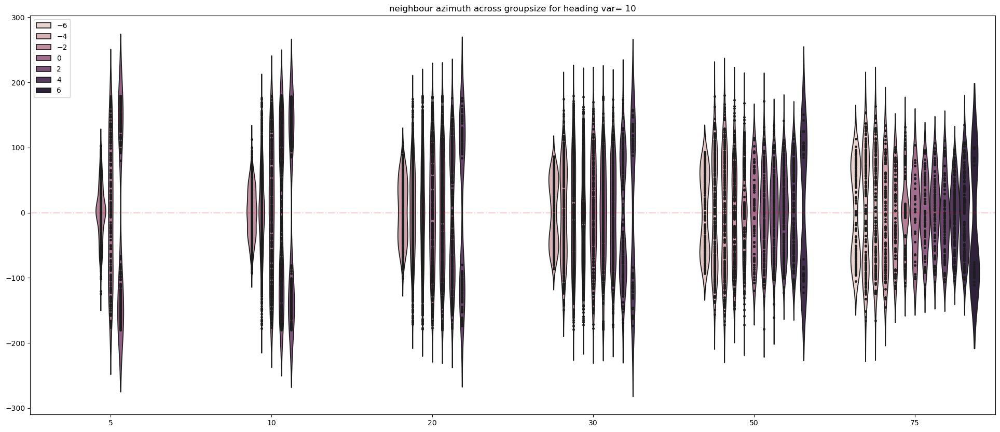

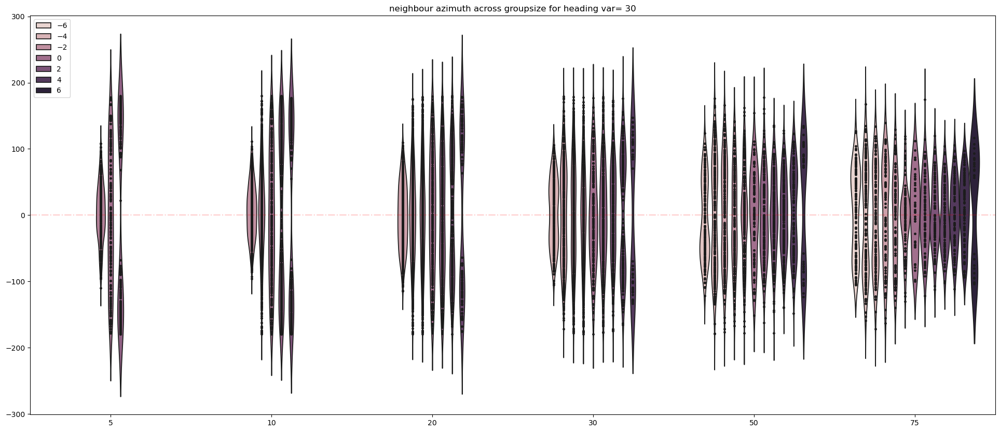

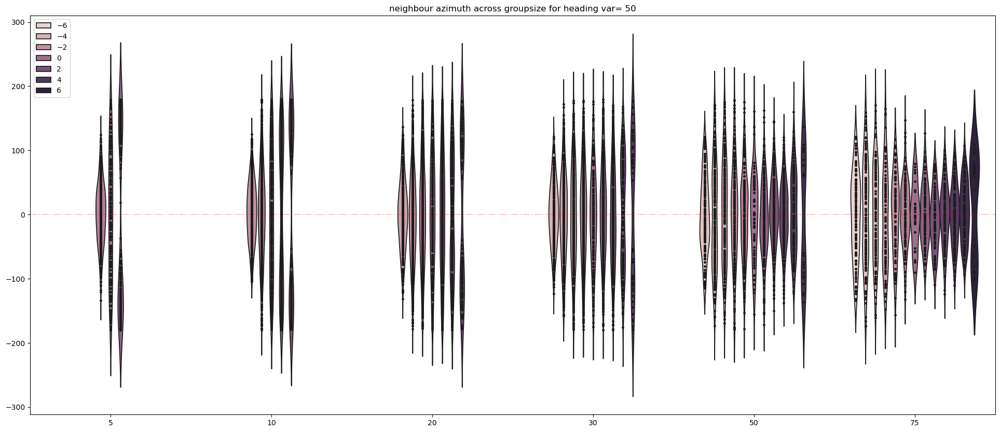

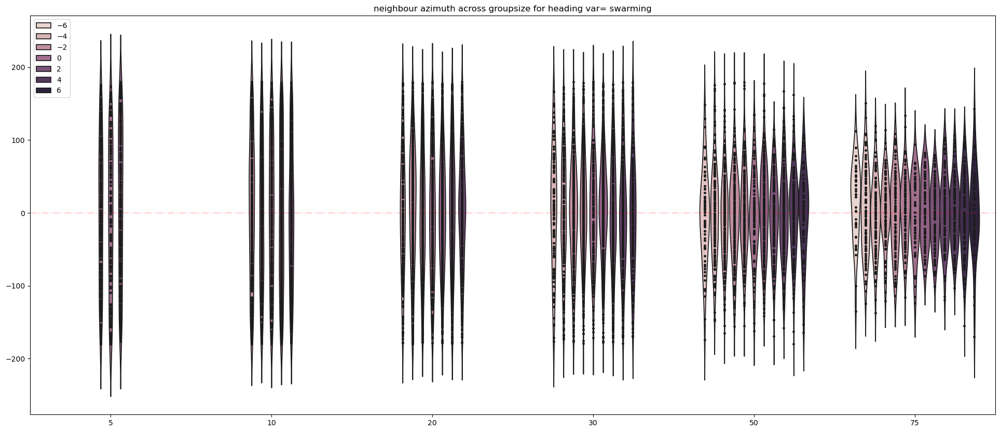

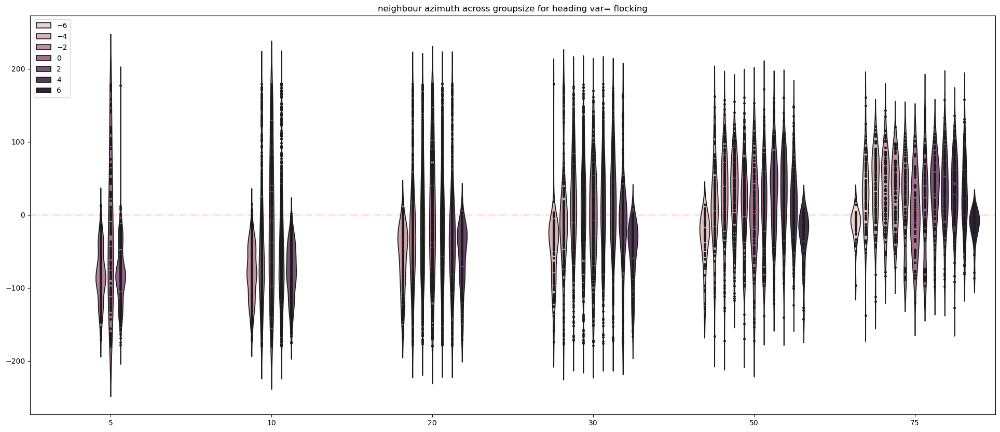

In [63]:
for heading_var in group_heading_variation:
    store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[heading_var]
    x,y,hue= modify_dict_for_seaborn(store_probability_of_detection_n_neighbour, "group_sizes", "neighbours_azimuth")
    plt.figure(figsize=(24,10))
    plt.axhline(0, ls= "-.", color="red", alpha=0.2)
    sns.violinplot(x=x, y=y, hue=hue, inner="point", hue_order=store_probability_of_detection_n_neighbour.keys())
    plt.title("neighbour azimuth across groupsize for heading var= "+ str(heading_var))
# plt.ylim(-180,180)

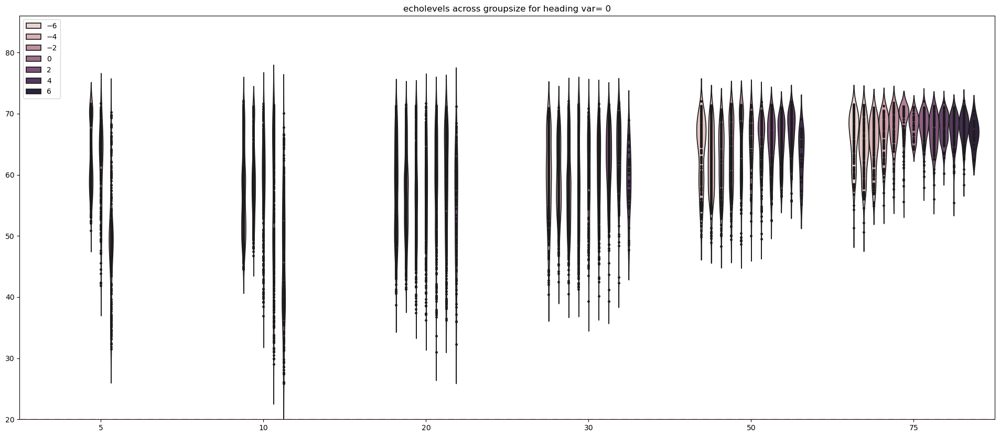

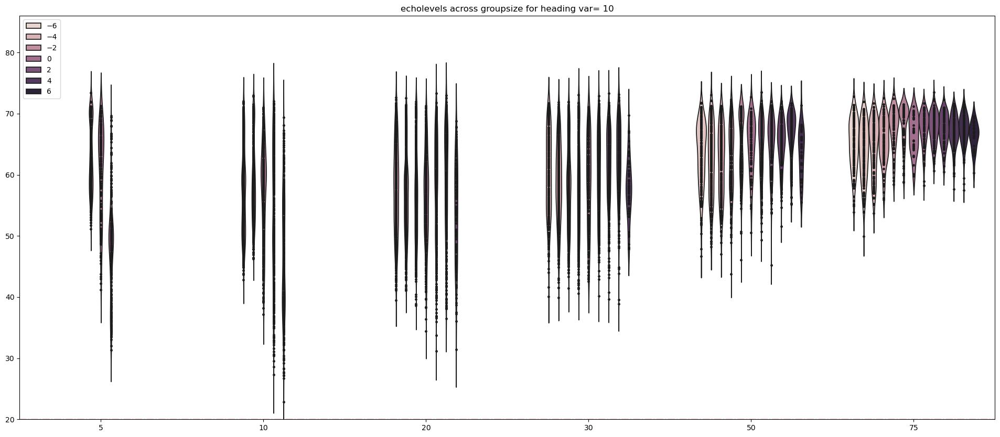

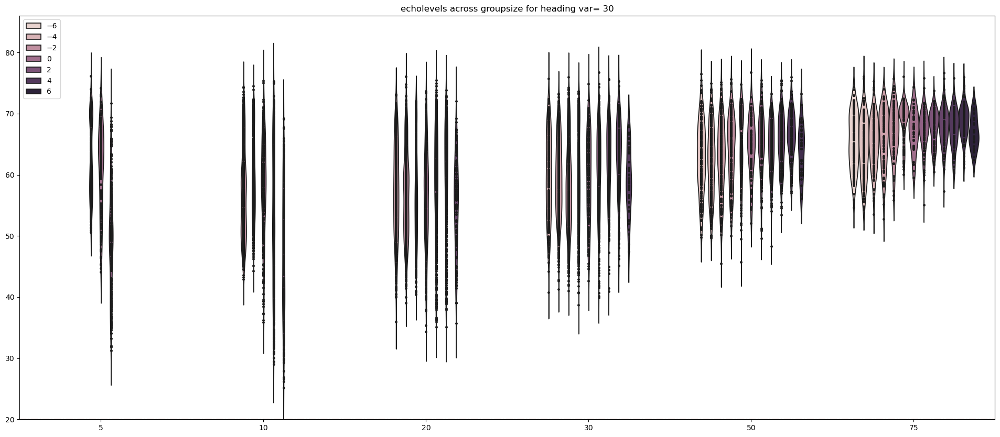

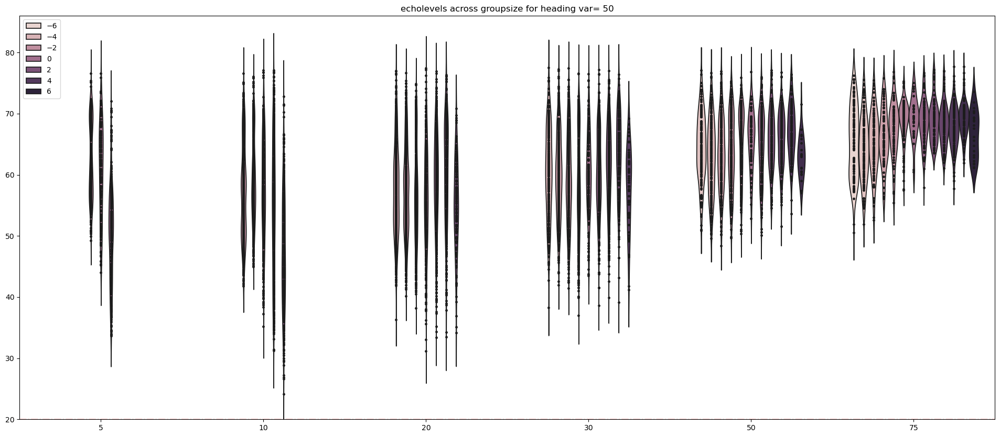

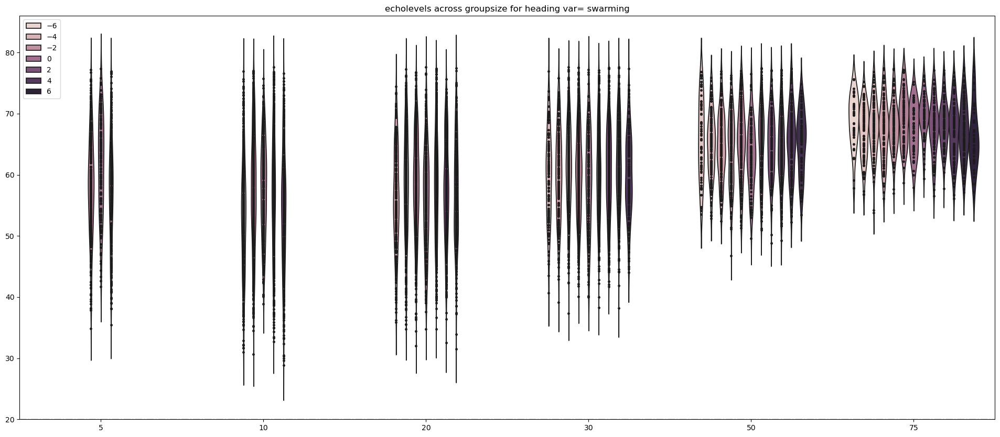

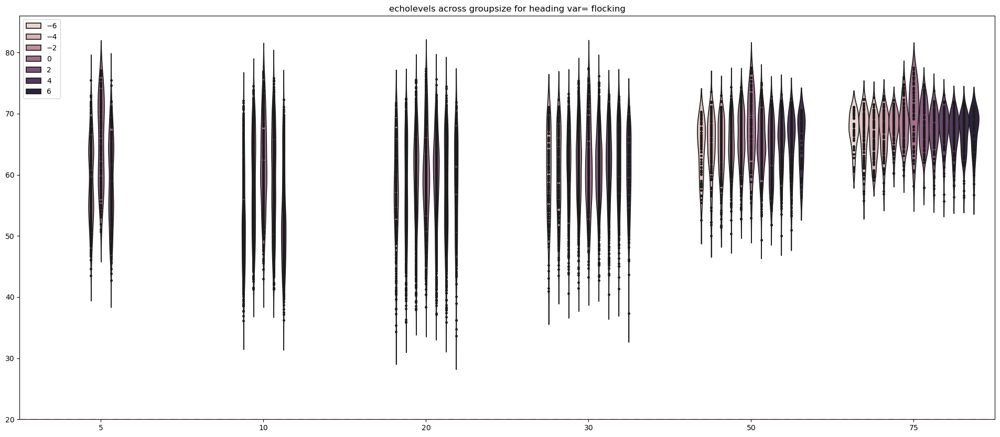

In [60]:
for heading_var in group_heading_variation:
    store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[heading_var]
    x,y,hue= modify_dict_for_seaborn(store_probability_of_detection_n_neighbour, "group_sizes", "echolevels")
    plt.figure(figsize=(24,10))
    plt.axhline(20, ls= "-.", color="red", alpha=0.2)
    sns.violinplot(x=x, y=y, hue=hue, inner="point", hue_order=store_probability_of_detection_n_neighbour.keys())
    plt.title("echolevels across groupsize for heading var= "+ str(heading_var))
    plt.ylim(20,86)


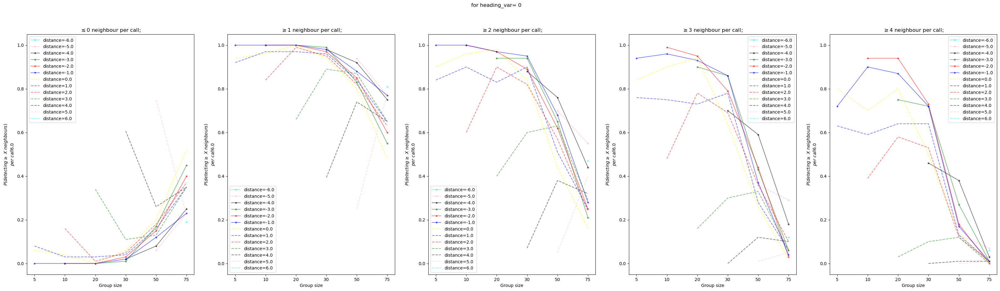

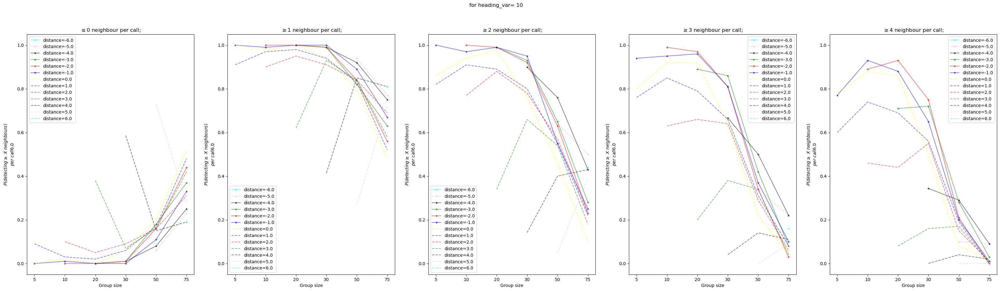

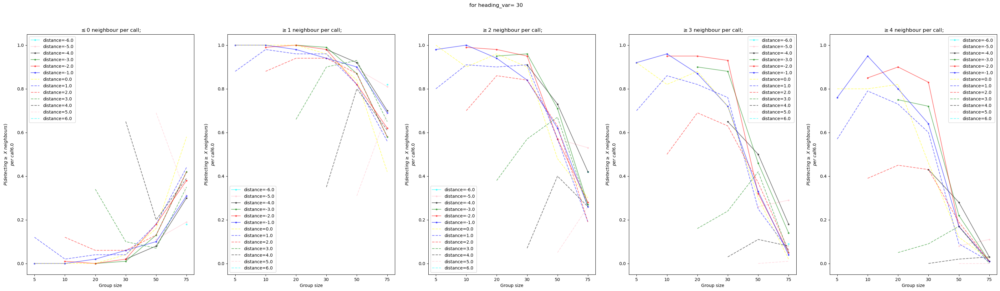

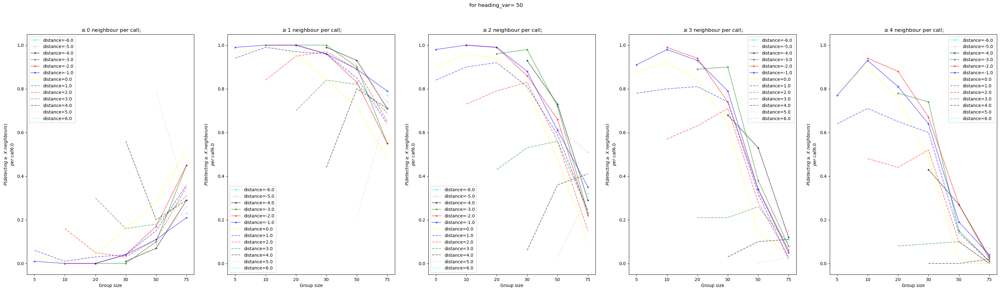

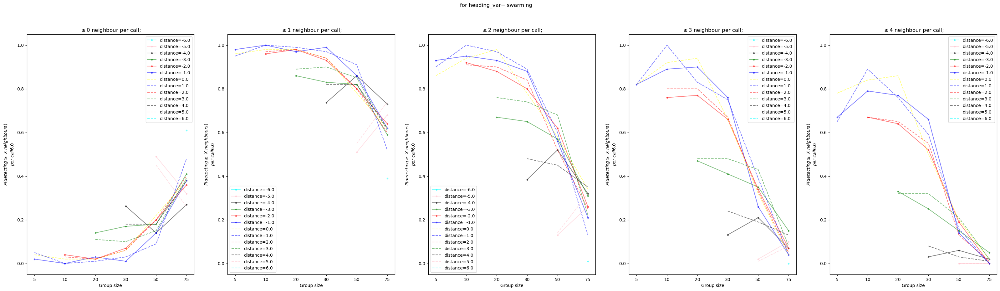

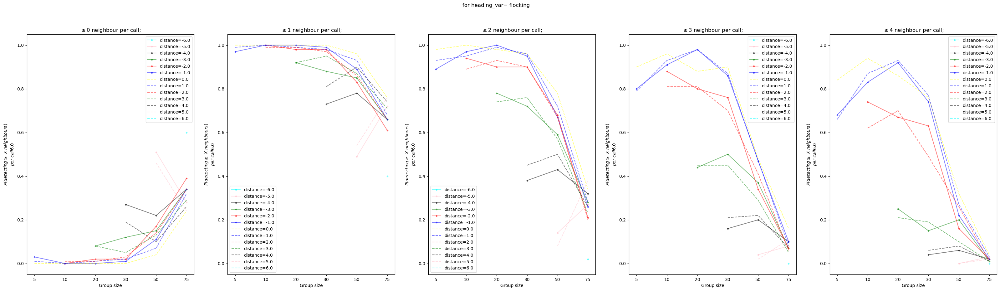

In [61]:
j=0

for heading_var in group_heading_variation:
        j=0
        plt.figure(figsize= (40,10))
        store_probability_of_detection_n_neighbour = store_nbrs_across_heading_var[heading_var]
        number_of_neighbours_atleast_detected= [0,1,2,3,4]
        i=0; 
        number_of_columns=5; number_of_rows= 1#int(np.ceil(len(number_of_neighbours_atleast_detected)/number_of_columns))
        

        for simulation_data in sublist_of_simulation_data_intransect:
                color_given_index= colors[int(float(simulation_data["focal_bat"][0][0]))-1]
                groupsizes= group_sizes

                key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
                # print(key_for_dict)
                # print(simulation_data["focal_bat"][0][0])
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

                if sign_based_on_distance_from_centermost_point[i]<0:
                        ls= ".-"
                else:
                        ls= "--"

                plt.subplot(number_of_rows,number_of_columns,2+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_1neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color= color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,3+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_2neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,4+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_3neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,5+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_4neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,1+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['0neighbours'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                i+=1
        for i in range(1,6):
                if i==1:
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\leq{i-1}$ neighbour per call;")
                else: 
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\geq{i-1}$ neighbour per call;")
                plt.ylabel('$P(detecting \geq \ X \ neighbours)$'+'\n'+ '$per \ call$'+str(simulation_data["focal_bat"][0][0]),
                        fontsize=10)
                plt.xlabel('Group size',
                        fontsize=10)
                plt.ylim(-0.05,1.05)
        plt.suptitle("for heading_var= " + str(heading_var))
        j+=1
plt.show()

In [ ]:
j=0

for heading_var in group_heading_variation:
        j=0
        plt.figure(figsize= (40,10))
        store_probability_of_detection_n_neighbour = store_nbrs_across_heading_var[heading_var]
        number_of_neighbours_atleast_detected= [0,1,2,3,4]
        i=0; 
        number_of_columns=5; number_of_rows= 1#int(np.ceil(len(number_of_neighbours_atleast_detected)/number_of_columns))
        

        for simulation_data in sublist_of_simulation_data_intransect:
                color_given_index= colors[int(float(simulation_data["focal_bat"][0][0]))-1]
                groupsizes= group_sizes

                key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
                # print(key_for_dict)
                # print(simulation_data["focal_bat"][0][0])
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

                if sign_based_on_distance_from_centermost_point[i]<0:
                        ls= ".-"
                else:
                        ls= "--"

                plt.subplot(number_of_rows,number_of_columns,2+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_1neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color= color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,3+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_2neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,4+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_3neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,5+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_4neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,1+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['0neighbours'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                i+=1
        for i in range(1,6):
                if i==1:
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\leq{i-1}$ neighbour per call;")
                else: 
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\geq{i-1}$ neighbour per call;")
                plt.ylabel('$P(detecting \geq \ X \ neighbours)$'+'\n'+ '$per \ call$'+str(simulation_data["focal_bat"][0][0]),
                        fontsize=10)
                plt.xlabel('Group size',
                        fontsize=10)
                plt.ylim(-0.05,1.05)
        plt.suptitle("for heading_var= " + str(heading_var))
        j+=1
plt.show()